##### <center> Homework 5 </center>

Часть 1. EDA

1. Скачайте датасет по ссылке: https://www.kaggle.com/uciml/breast-cancer-wisconsin-data
1. Посмотрите на базовые статистики датасета: средние, медианы, и т.д.
1. Постройте гистограммы/распределения признаков, при этом используйте целевую переменную, чтобы сгруппировать и раскрасить гистограммы.
1. Постройте heatmap для матрицы корреляций, есть ли признаки, которые сильно скоррелированы? Какие это признаки?
1. Постройте для сильно скоррелированных признаков попарные scatterplot-ы, действительно ли наблюдается линейная зависимость?
1. Используя boxplots и группировку по целевой переменной, попробуйте предположить, по каким признакам наиболее удобно было бы отделить злокачественные новообразования от доброкачественных.
Также очень приветствуется ваша инициатива по визуализациям и исследовании данных :)


Часть 2. Моделирование при помощи kNN

1. Разбейте данные на train-test, отложив 30% выборки для тестирования.
1. Приведите все непрерывные переменные к одному масштабу при помощи стандартизации. Кратко поясните, почему стандартизация здесь нужна.
1. Постройте модель kNN "из коробки" без настройки параметров. Оцените метрики качества бинарной классификации (accuracy, precision, recall, f1_score), постройте ROC-кривую и посчитайте площадь под ней.
1. Теперь проведите настройку параметра числа соседей на кросс-валидации. Снова оцените результаты, стало ли лучше? :)
1. Бонусное задание для любопытствующих, к которому можно вернуться после изучения логистической регрессии:
1. Как вы помните, логистическая регрессия плохо относится к линейно-зависимым признакам, уберите переменные, корреляция Пирсона между которыми превышает 0.85.
1. Постройте модель логистической регрессии "из коробки" без настройки параметров. Оцените метрики качества бинарной классификации (accuracy, precision, recall, f1_score), постройте ROC-кривую и посчитайте площадь под ней. Визуализируйте влияние коэффициентов на целевую переменную.
1. Теперь проведите настройку параметра регуляризации C на кросс-валидации (LogisticRegressionCV). Снова оцените результаты и постройте визуализацию влияния коэффициентов на целевую переменную. Сделайте интересные выводы :)
1. Какая из двух настроенных моделей, kNN или логистическая регрессия оказалась, в итоге, лучше?

In [1]:
import numpy as np
import numpy.linalg as la
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')

import plotly.express as px

from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from sklearn import datasets
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error

%matplotlib inline
np.random.seed(123)

import warnings
warnings.filterwarnings("ignore")

In [2]:
data = pd.read_csv('data.csv')
data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [3]:
data.shape

(569, 33)

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [5]:
data.isna()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
565,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
566,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
567,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True


In [6]:
data.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

Выводы:

Датасет содержит 32 колонки и 569 рядов. Нет пропущенных значений, за исключением колонки Unnamed: 32.

Целевой показатель (диагноз) категориальный, поэтому нужно перекодировать его в числовой. 

Очевидно, что колонку Unnamed, которая содержит значения Nan, можно удалить, т.к. эти значения не играют роли для модели. 

Также предполагаем, что можно удалить колонку id, т.к. вряд ли диагноз зависит от порядкового номера. Но для достоверности сделаем это после проверки датасета на корреляцию.    

In [7]:
# Перекодируем категориальные данные из столбца diagnosis в числовые значения
label_encoder = preprocessing.LabelEncoder()
label_encoder.fit(data['diagnosis'])
# Сначала посмотрим какие вообще значения есть в этом столбце
print(list(label_encoder.classes_))
# Получили два уникальных значения из столбца diagnosis: B, M. Значит будем присваивать два числовых значения: 0 для B, 1 для M.
# Переведем категориальные данные в числовые и проверим все ли получилось
print(label_encoder.transform(data['diagnosis']))
data['diagnosis'].replace(['B', 'M'], [0, 1], inplace=True)
data.head()

['B', 'M']
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 0 1 1 1 1 1 1 1 1 0 1 0 0 0 0 0 1 1 0 1 1 0 0 0 0 1 0 1 1 0 0 0 0 1 0 1 1
 0 1 0 1 1 0 0 0 1 1 0 1 1 1 0 0 0 1 0 0 1 1 0 0 0 1 1 0 0 0 0 1 0 0 1 0 0
 0 0 0 0 0 0 1 1 1 0 1 1 0 0 0 1 1 0 1 0 1 1 0 1 1 0 0 1 0 0 1 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 1 1 0 1 0 0 1 1 0 0 1 1 0 0 0 0 1 0 0 1 1 1 0 1
 0 1 0 0 0 1 0 0 1 1 0 1 1 1 1 0 1 1 1 0 1 0 1 0 0 1 0 1 1 1 1 0 0 1 1 0 0
 0 1 0 0 0 0 0 1 1 0 0 1 0 0 1 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 0 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 1 1 0 0
 0 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 1
 1 0 1 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 1 0 0 0 0 0 1 0 0
 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 1

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [8]:
#Теперь удалим из датасета колонку Unnamed и проверим все ли получилось
# data.drop(columns=['Unnamed: 32'], inplace=True)
data.drop(['Unnamed: 32'], axis=1, inplace=True)
data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


2. Посмотрите на базовые статистики датасета: средние, медианы, и т.д.

In [9]:
data.describe()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,0.372583,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,0.483918,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,0.000000,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,0.000000,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,0.000000,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,1.000000,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,1.000000,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


3. Постройте гистограммы/распределения признаков, при этом используйте целевую переменную, чтобы сгруппировать и раскрасить гистограммы.

array([[<AxesSubplot:title={'center':'diagnosis'}>,
        <AxesSubplot:title={'center':'radius_mean'}>,
        <AxesSubplot:title={'center':'texture_mean'}>,
        <AxesSubplot:title={'center':'perimeter_mean'}>,
        <AxesSubplot:title={'center':'area_mean'}>,
        <AxesSubplot:title={'center':'smoothness_mean'}>],
       [<AxesSubplot:title={'center':'compactness_mean'}>,
        <AxesSubplot:title={'center':'concavity_mean'}>,
        <AxesSubplot:title={'center':'concave points_mean'}>,
        <AxesSubplot:title={'center':'symmetry_mean'}>,
        <AxesSubplot:title={'center':'fractal_dimension_mean'}>,
        <AxesSubplot:title={'center':'radius_se'}>],
       [<AxesSubplot:title={'center':'texture_se'}>,
        <AxesSubplot:title={'center':'perimeter_se'}>,
        <AxesSubplot:title={'center':'area_se'}>,
        <AxesSubplot:title={'center':'smoothness_se'}>,
        <AxesSubplot:title={'center':'compactness_se'}>,
        <AxesSubplot:title={'center':'concavity_

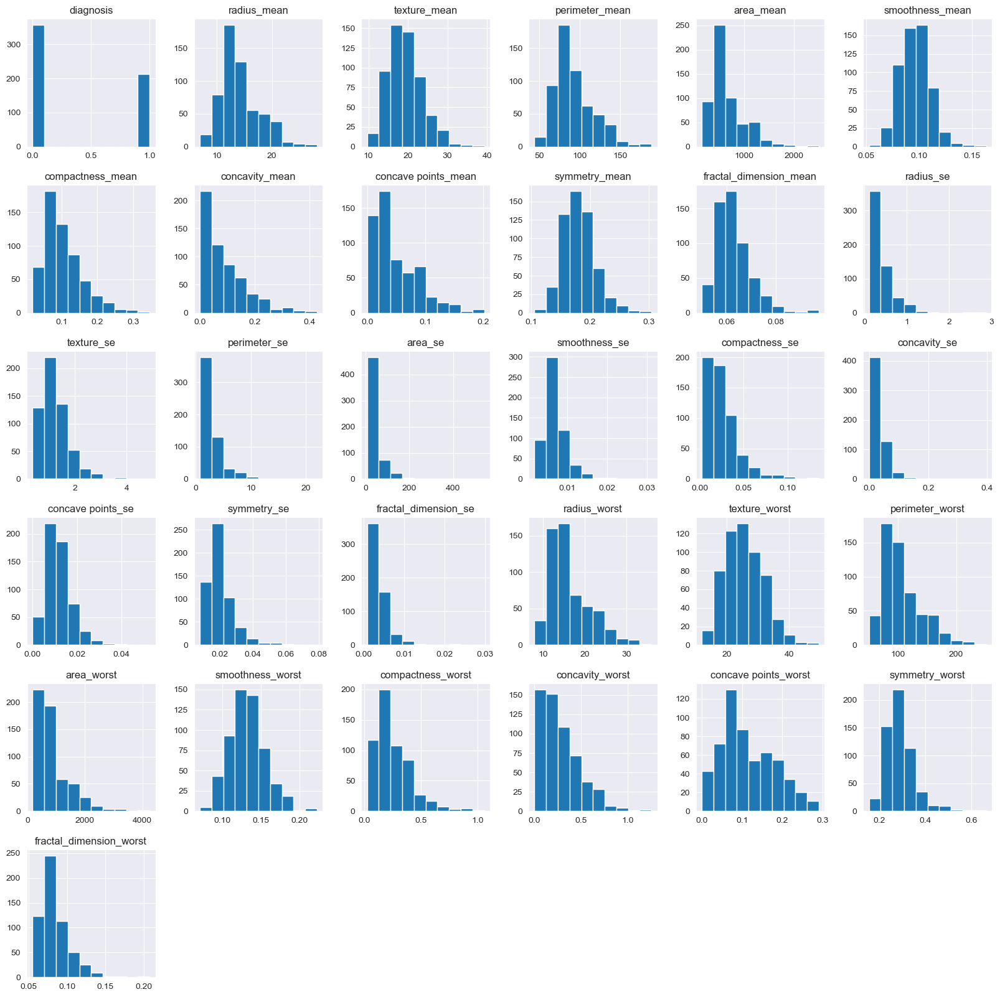

In [10]:
# Сначала для наглядности и понимания посмотрим распределение каждого признака

df = pd.DataFrame(data)
data[df.columns[1:32]].hist(figsize=(20, 20))

Теперь посмотрим распределение каждого признака. 
Диаграммы plotly загружаются через раз. Поэтому на всякий случай они продублированы в виде картинок. 

In [11]:
fig = px.histogram(df, x='radius_mean', color='diagnosis', marginal = 'box')
fig.show()

# или варианты попроще:
#sns.histplot(data=data, x='radius_mean', hue='diagnosis', alpha=0.5)

#sns.histplot(data=data, x='radius_mean', hue='diagnosis', bins=20)

#sns.histplot(data=data, x='radius_mean', hue='diagnosis', multiple="stack")

#plt.hist(x = data[data['diagnosis'] == 1]['radius_mean'], alpha=0.5)
#plt.hist(x = data[data['diagnosis'] == 0]['radius_mean'], alpha=0.5)
#plt.xlabel('diagnosis: 1|0')
#plt.ylabel('radius_mean')

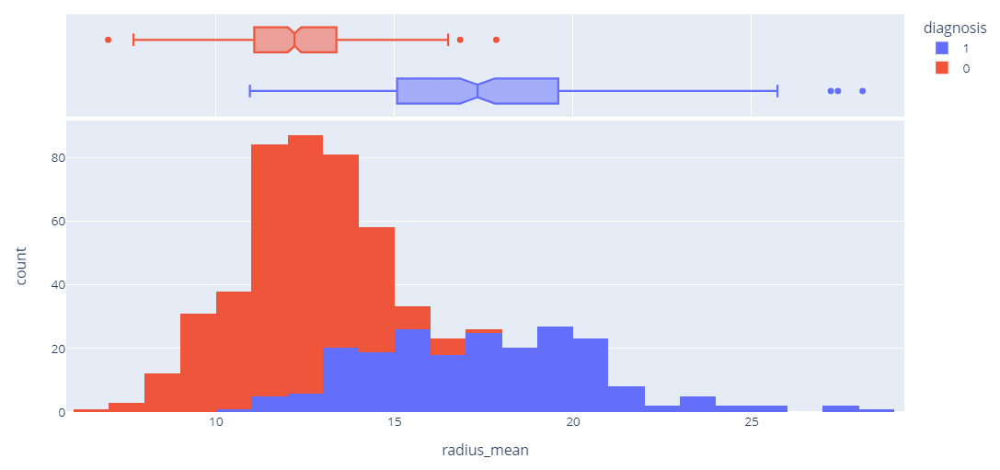

In [12]:
fig = px.histogram(df, x='texture_mean', color='diagnosis', marginal = 'box')
fig.show()

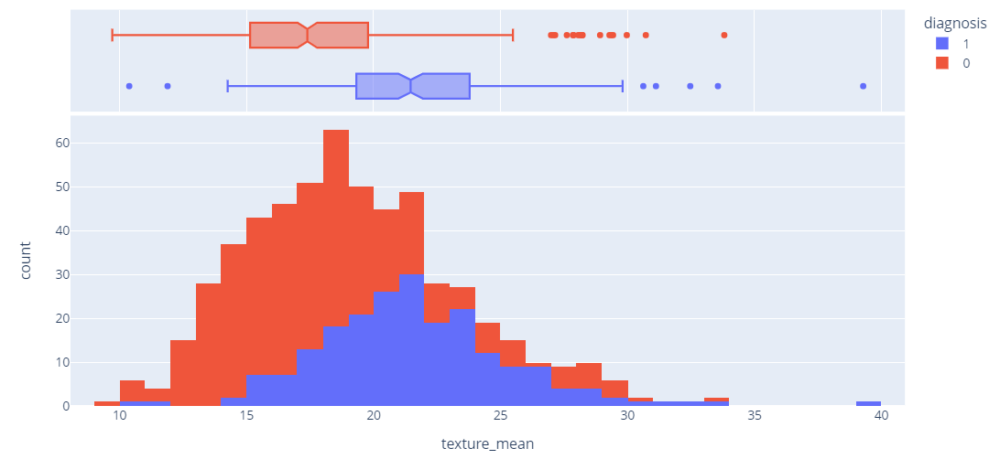

In [13]:
fig = px.histogram(df, x='perimeter_mean', color='diagnosis', marginal = 'box')
fig.show()

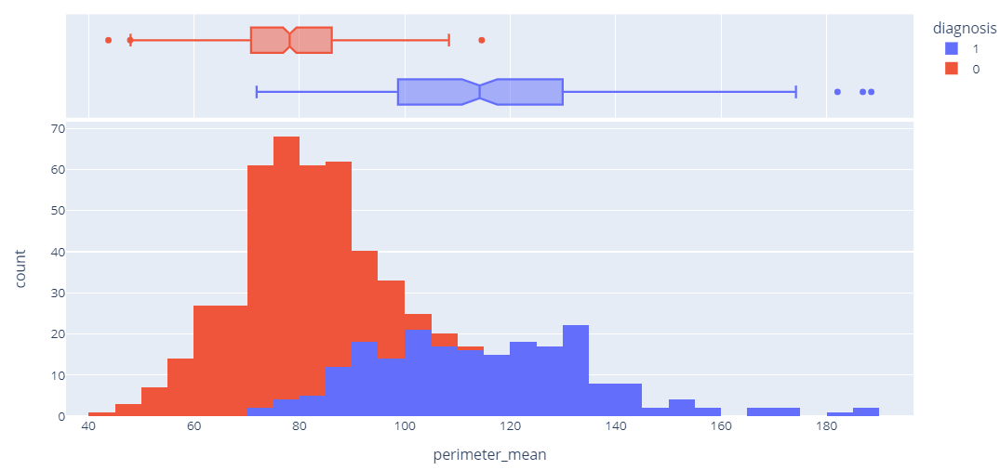

In [14]:
fig = px.histogram(df, x='area_mean', color='diagnosis', marginal = 'box')
fig.show()

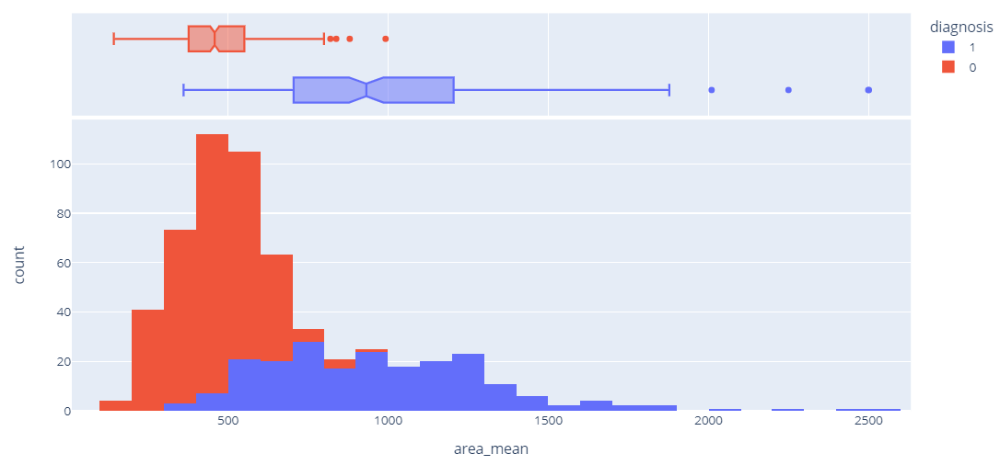

In [15]:
fig = px.histogram(df, x='compactness_mean', color='diagnosis', marginal = 'box')
fig.show()

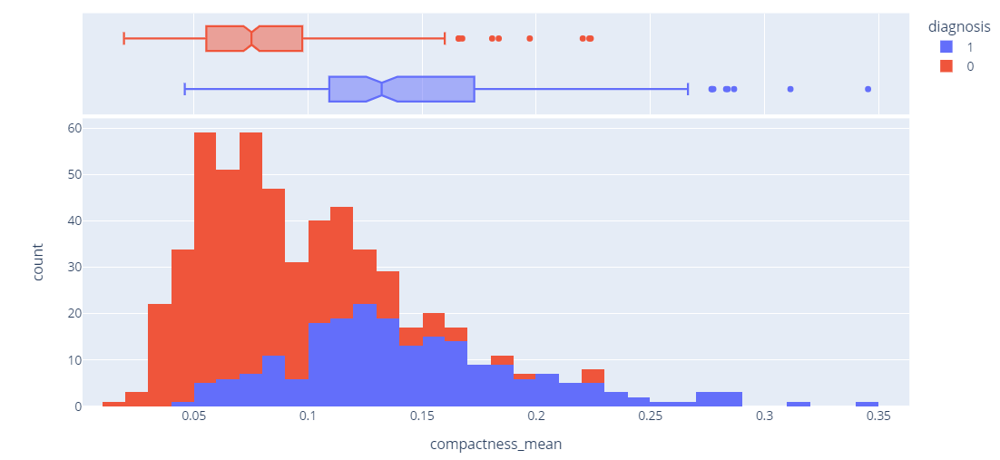

In [16]:
fig = px.histogram(df, x='concavity_mean', color='diagnosis', marginal = 'box')
fig.show()

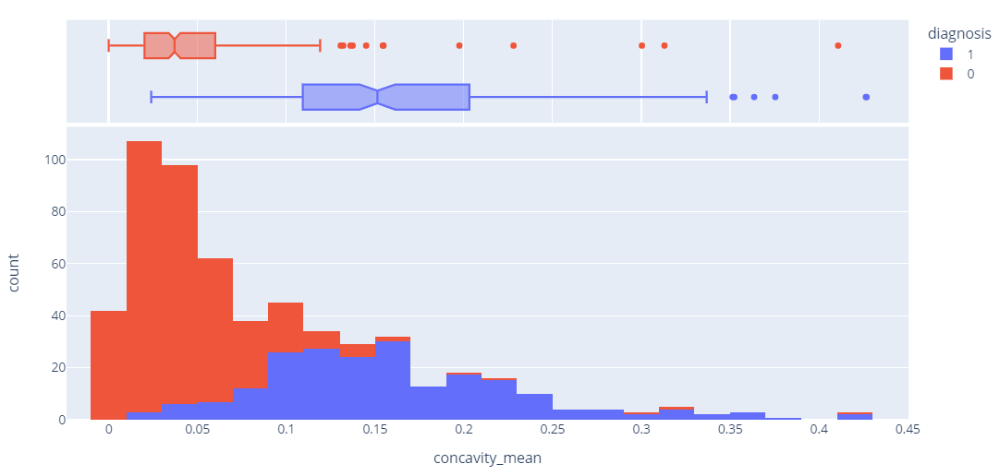

In [17]:
fig = px.histogram(df, x='concave points_mean', color='diagnosis', marginal = 'box')
fig.show()

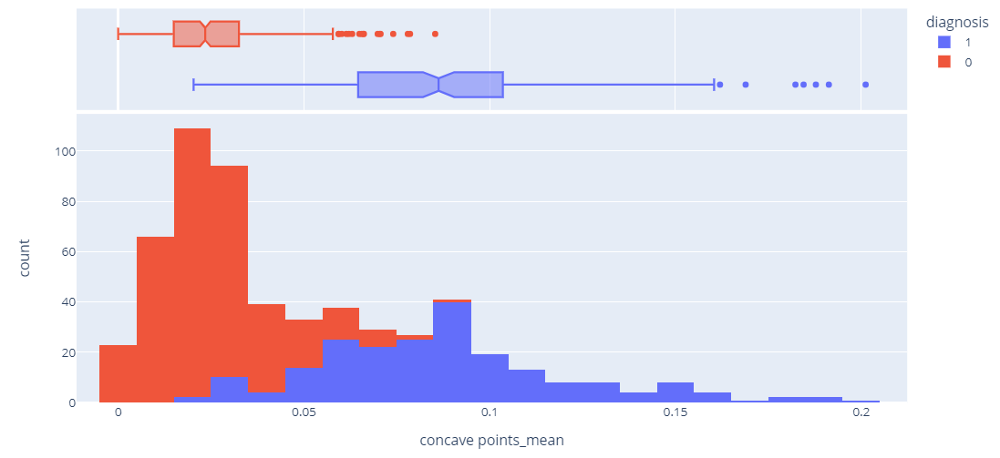

In [18]:
fig = px.histogram(df, x='symmetry_mean', color='diagnosis', marginal = 'box')
fig.show()

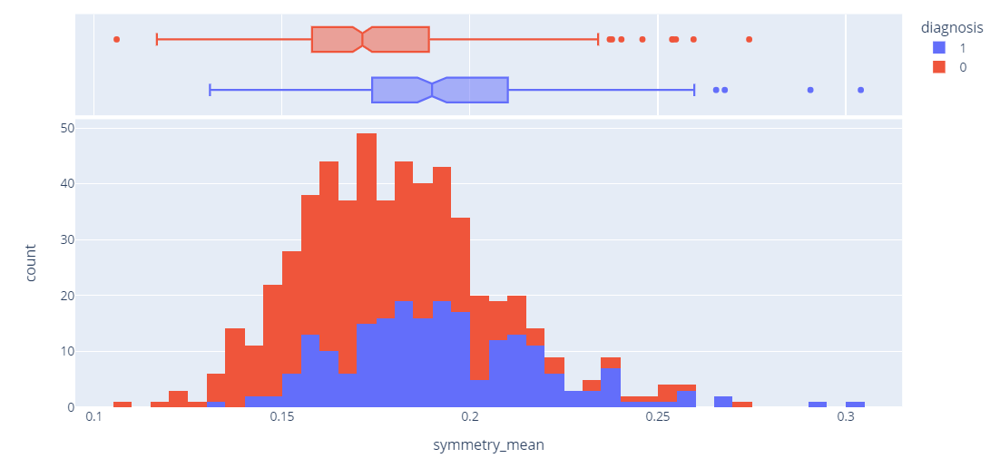

In [19]:
fig = px.histogram(df, x='fractal_dimension_mean', color='diagnosis', marginal = 'box')
fig.show()

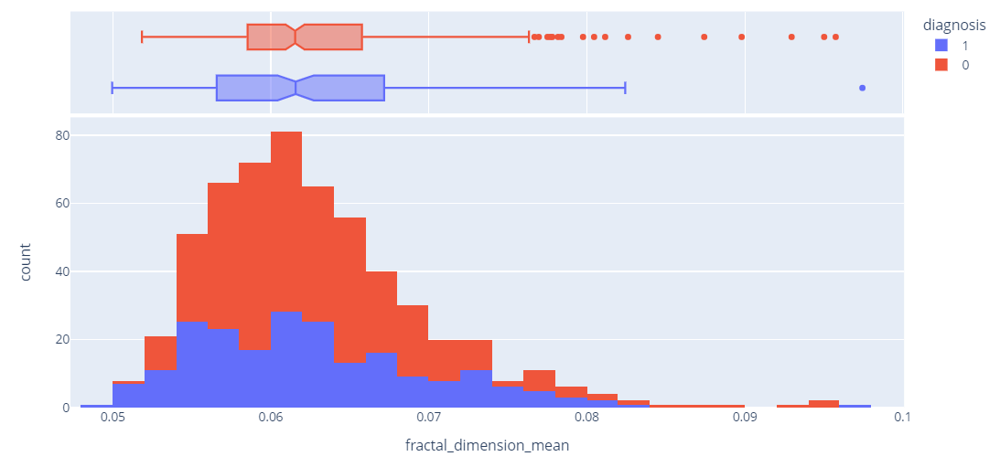

In [20]:
fig = px.histogram(df, x='radius_se', color='diagnosis', marginal = 'box')
fig.show()

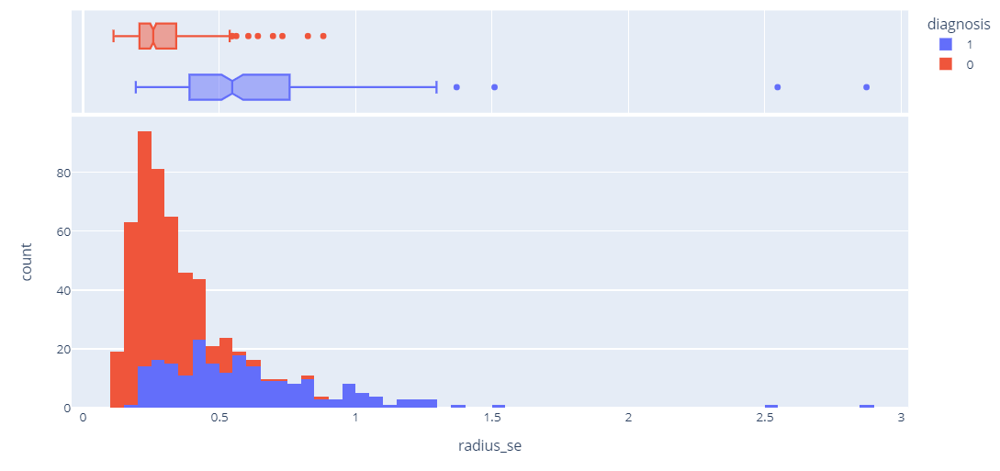

In [21]:
fig = px.histogram(df, x='texture_se', color='diagnosis', marginal = 'box')
fig.show()

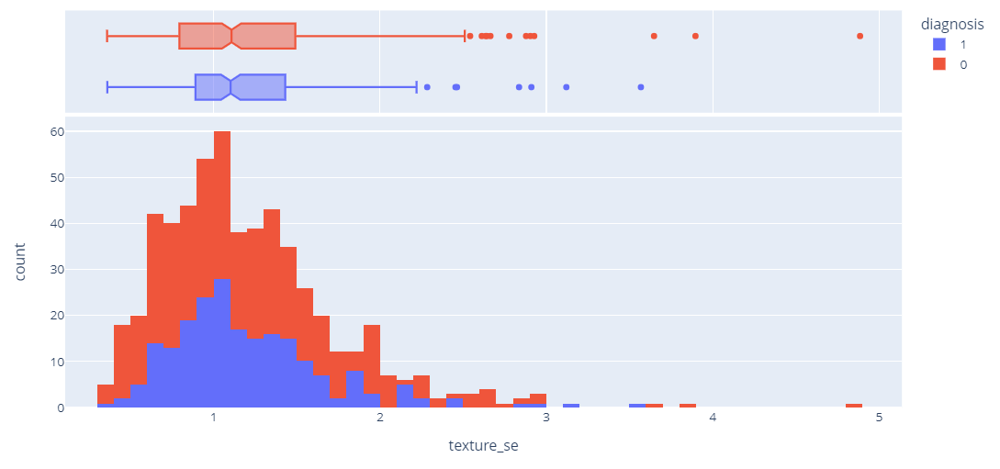

In [22]:
fig = px.histogram(df, x='perimeter_se', color='diagnosis', marginal = 'box')
fig.show()

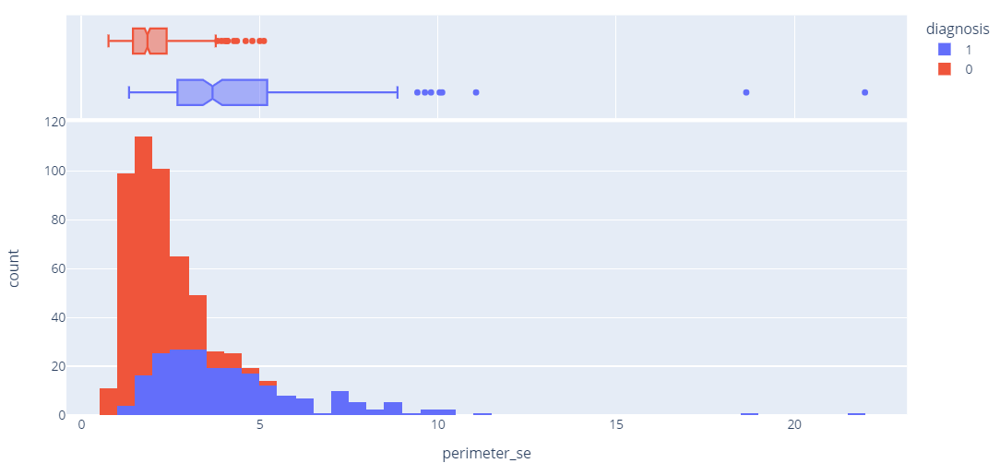

In [23]:
fig = px.histogram(df, x='area_se', color='diagnosis', marginal = 'box')
fig.show()

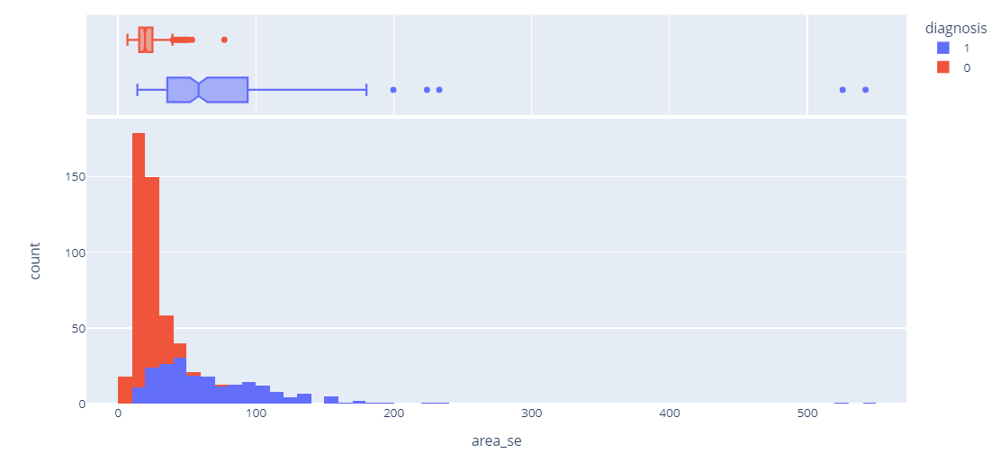

In [24]:
fig = px.histogram(df, x='smoothness_se', color='diagnosis', marginal = 'box')
fig.show()

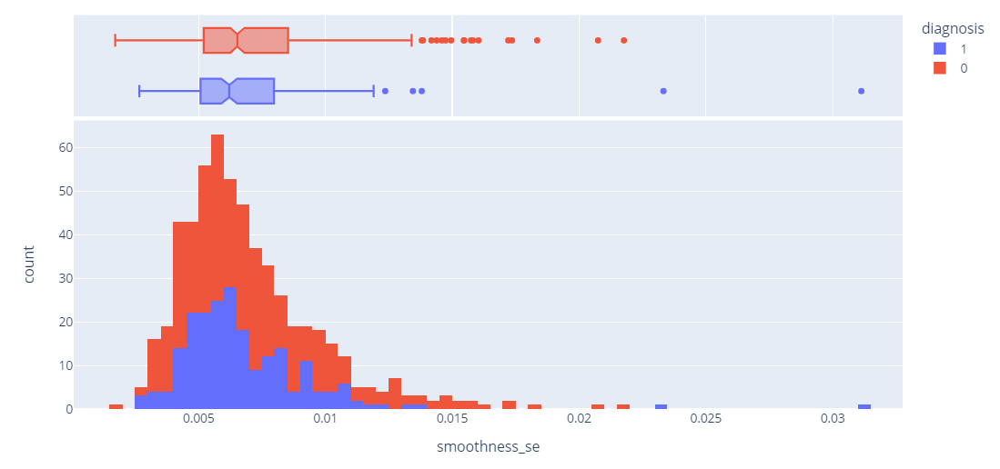

In [25]:
fig = px.histogram(df, x='compactness_se', color='diagnosis', marginal = 'box')
fig.show()

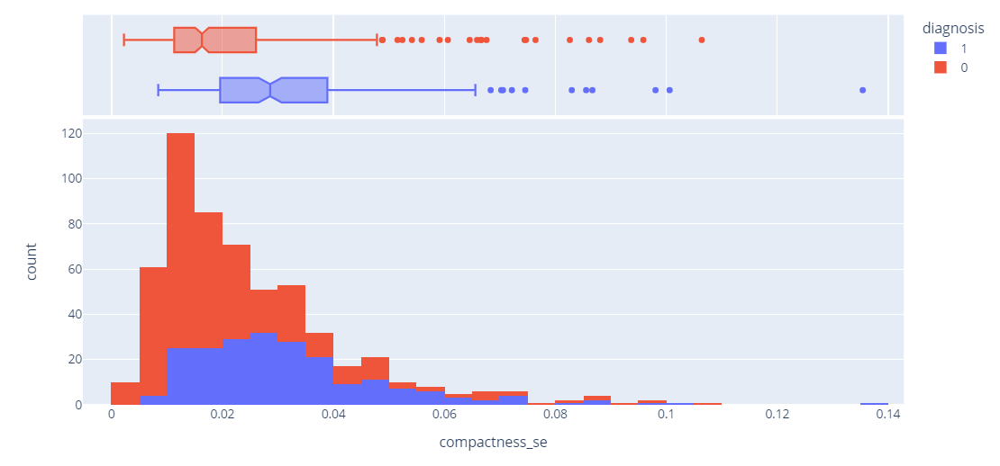

In [26]:
fig = px.histogram(df, x='concavity_se', color='diagnosis', marginal = 'box')
fig.show()

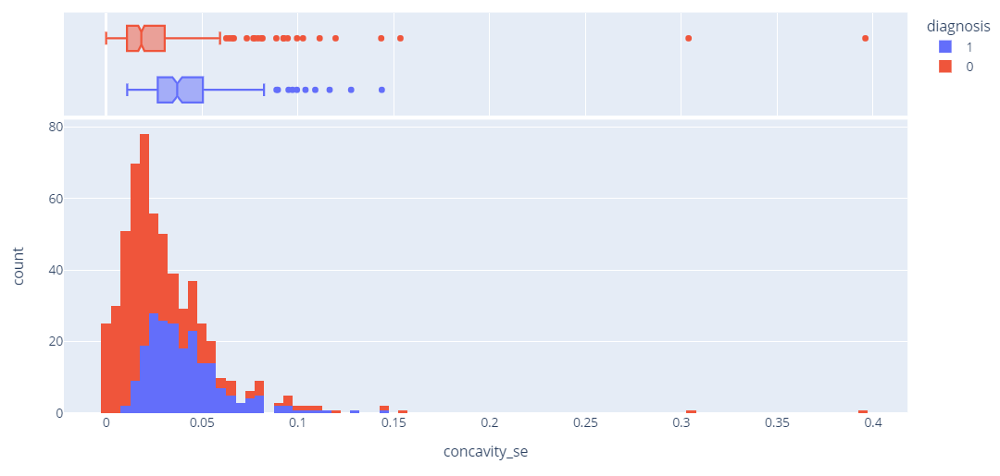

In [27]:
fig = px.histogram(df, x='concave points_se', color='diagnosis', marginal = 'box')
fig.show()

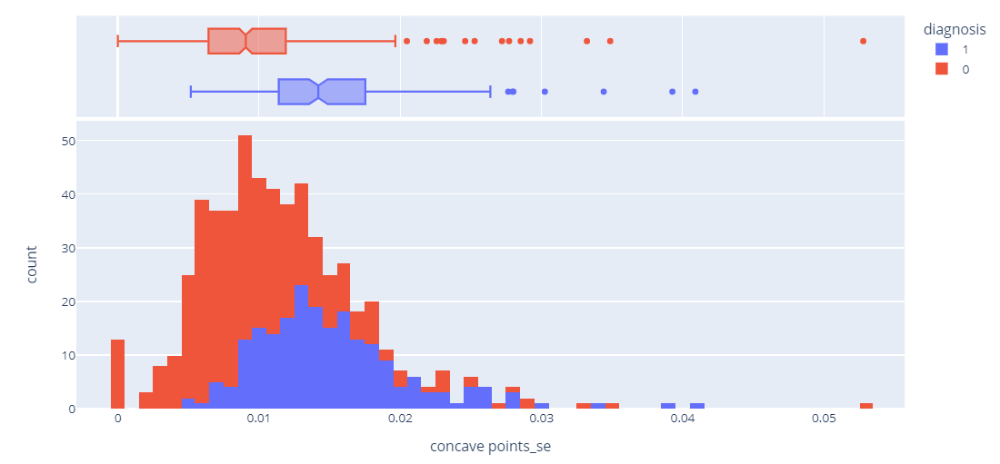

In [28]:
fig = px.histogram(df, x='symmetry_se', color='diagnosis', marginal = 'box')
fig.show()

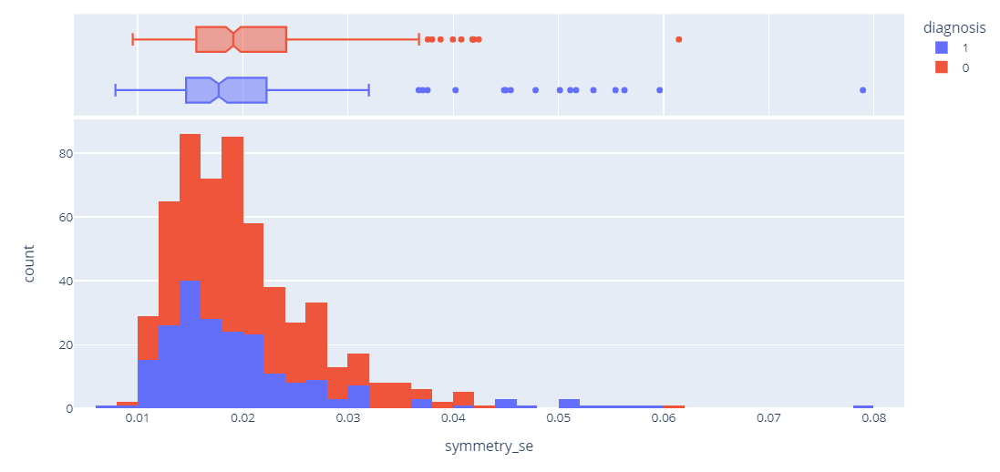

In [29]:
fig = px.histogram(df, x='fractal_dimension_se', color='diagnosis', marginal = 'box')
fig.show()

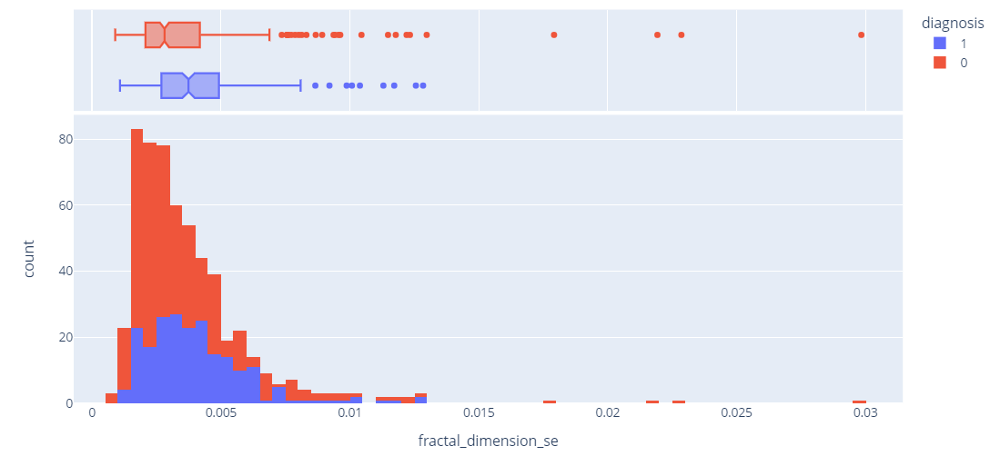

In [30]:
fig = px.histogram(df, x='radius_worst', color='diagnosis', marginal = 'box')
fig.show()

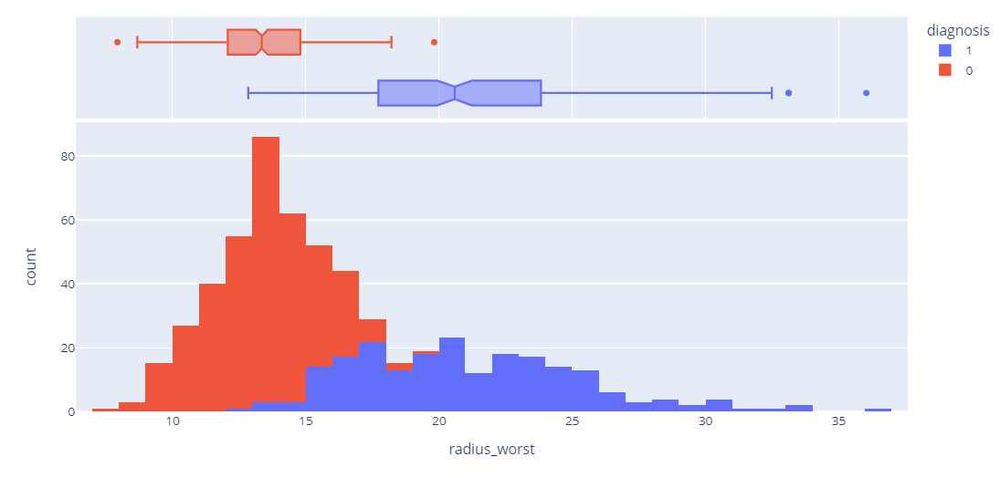

In [31]:
fig = px.histogram(df, x='texture_worst', color='diagnosis', marginal = 'box')
fig.show()

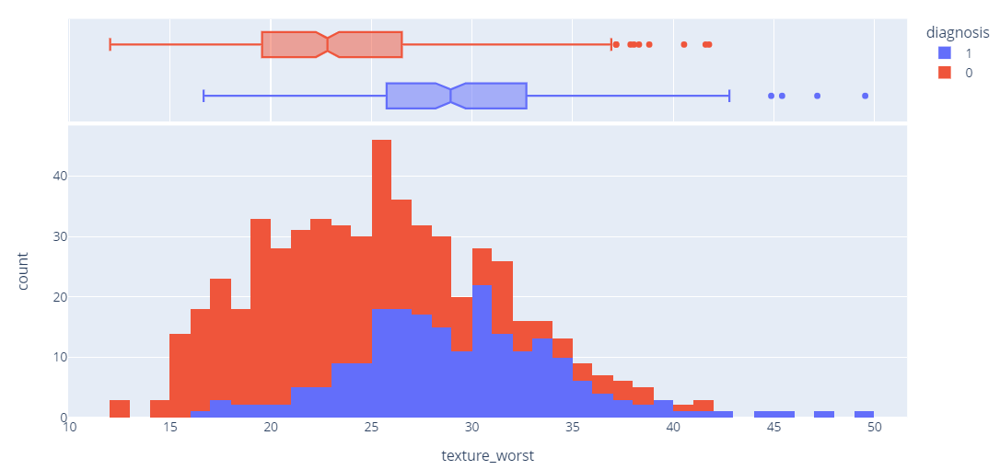

In [32]:
fig = px.histogram(df, x='perimeter_worst', color='diagnosis', marginal = 'box')
fig.show()

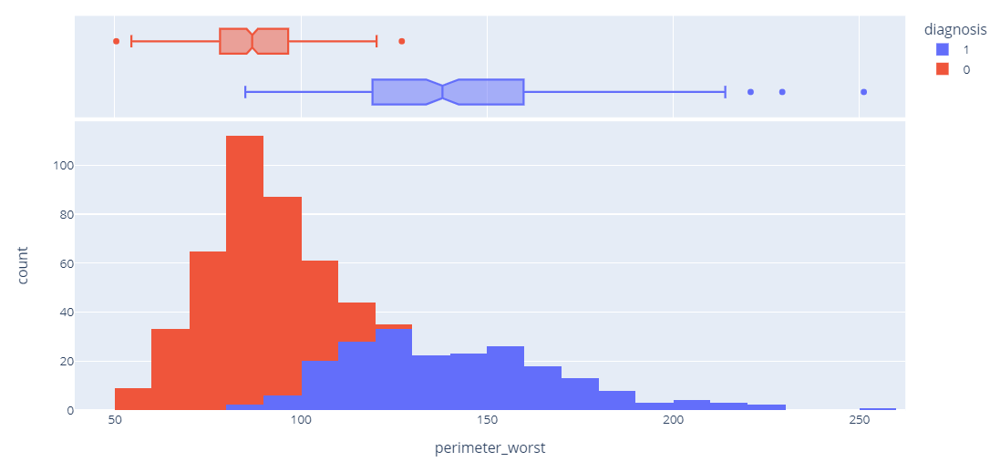

In [33]:
fig = px.histogram(df, x='area_worst', color='diagnosis', marginal = 'box')
fig.show()

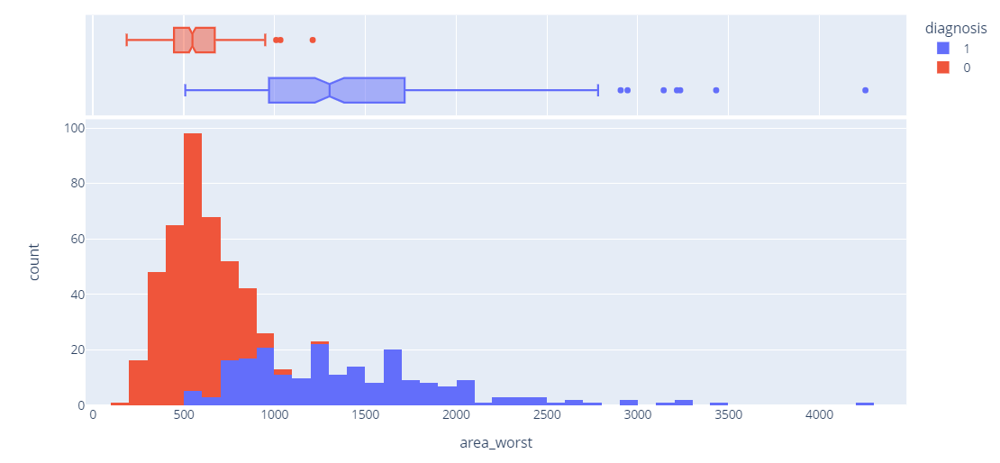

In [34]:
fig = px.histogram(df, x='smoothness_worst', color='diagnosis', marginal = 'box')
fig.show()

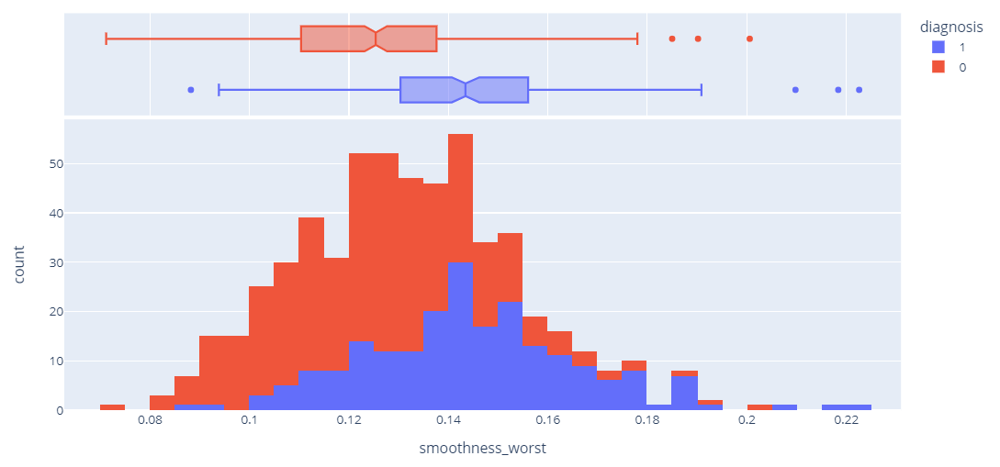

In [35]:
fig = px.histogram(df, x='compactness_worst', color='diagnosis', marginal = 'box')
fig.show()

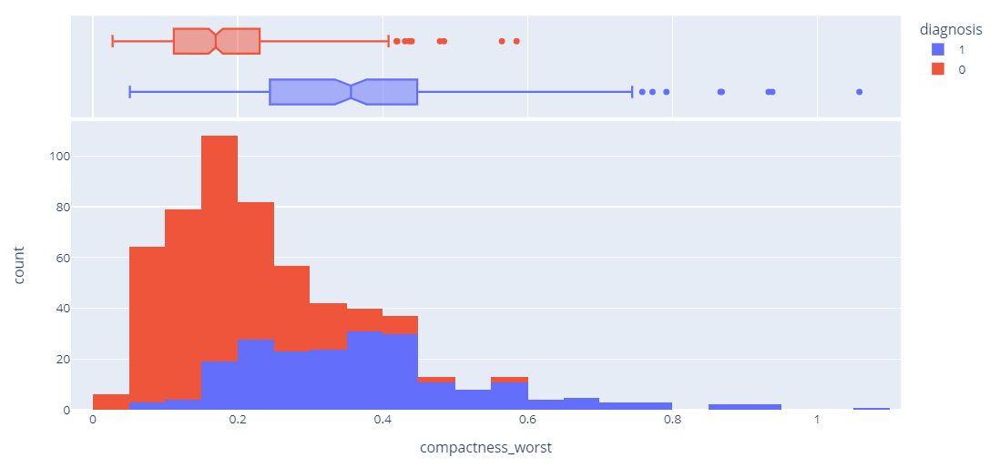

In [36]:
fig = px.histogram(df, x='concavity_worst', color='diagnosis', marginal = 'box')
fig.show()

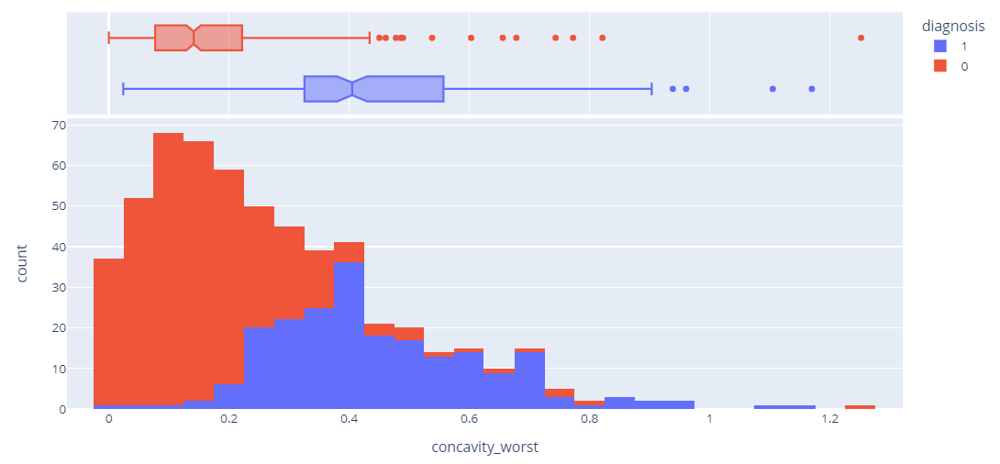

In [37]:
fig = px.histogram(df, x='concave points_worst', color='diagnosis', marginal = 'box')
fig.show()

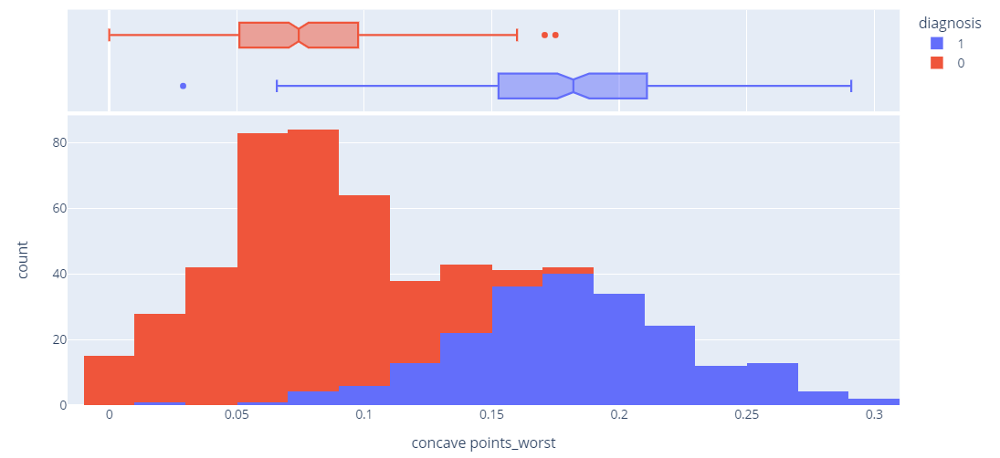

In [38]:
fig = px.histogram(df, x='symmetry_worst', color='diagnosis', marginal = 'box')
fig.show()

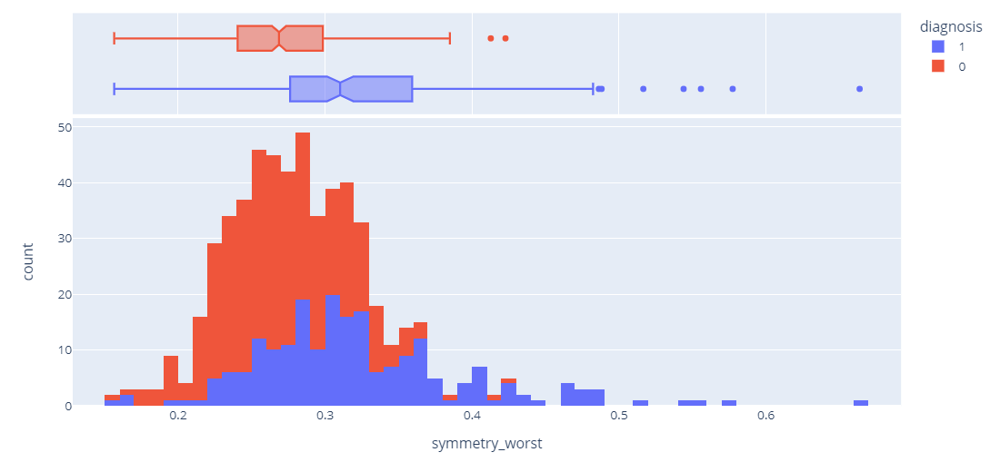

In [39]:
fig = px.histogram(df, x='fractal_dimension_worst', color='diagnosis', marginal = 'box')
fig.show()

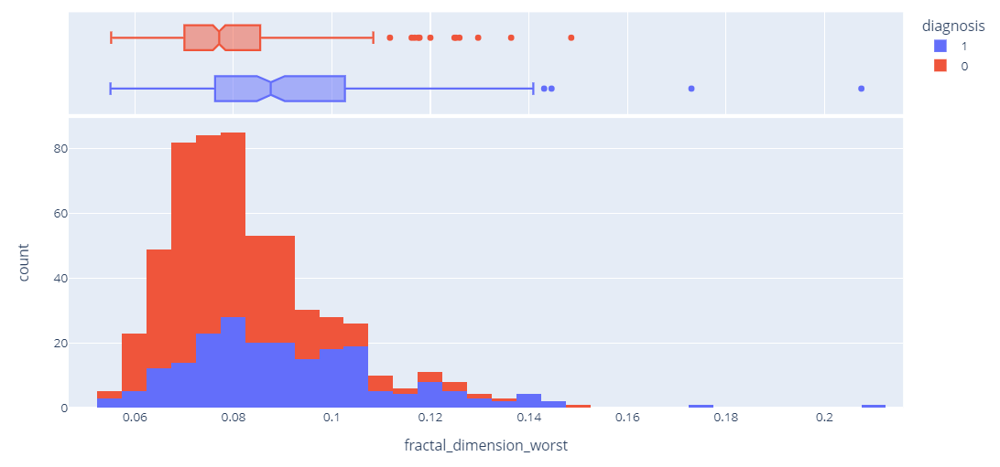

4. Постройте heatmap для матрицы корреляций, есть ли признаки, которые сильно скоррелированы? Какие это признаки?

In [40]:
data.corr()  

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
id,1.000000,0.039769,0.074626,0.099770,0.073159,0.096893,-0.012968,0.000096,0.050080,0.044158,...,0.082405,0.064720,0.079986,0.107187,0.010338,-0.002968,0.023203,0.035174,-0.044224,-0.029866
diagnosis,0.039769,1.000000,0.730029,0.415185,0.742636,0.708984,0.358560,0.596534,0.696360,0.776614,...,0.776454,0.456903,0.782914,0.733825,0.421465,0.590998,0.659610,0.793566,0.416294,0.323872
radius_mean,0.074626,0.730029,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,...,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066
texture_mean,0.099770,0.415185,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,...,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205
perimeter_mean,0.073159,0.742636,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,...,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019
area_mean,0.096893,0.708984,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,...,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738
smoothness_mean,-0.012968,0.358560,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,...,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316
compactness_mean,0.000096,0.596534,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,...,0.535315,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382
concavity_mean,0.050080,0.696360,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,...,0.688236,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930
concave points_mean,0.044158,0.776614,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,...,0.830318,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661


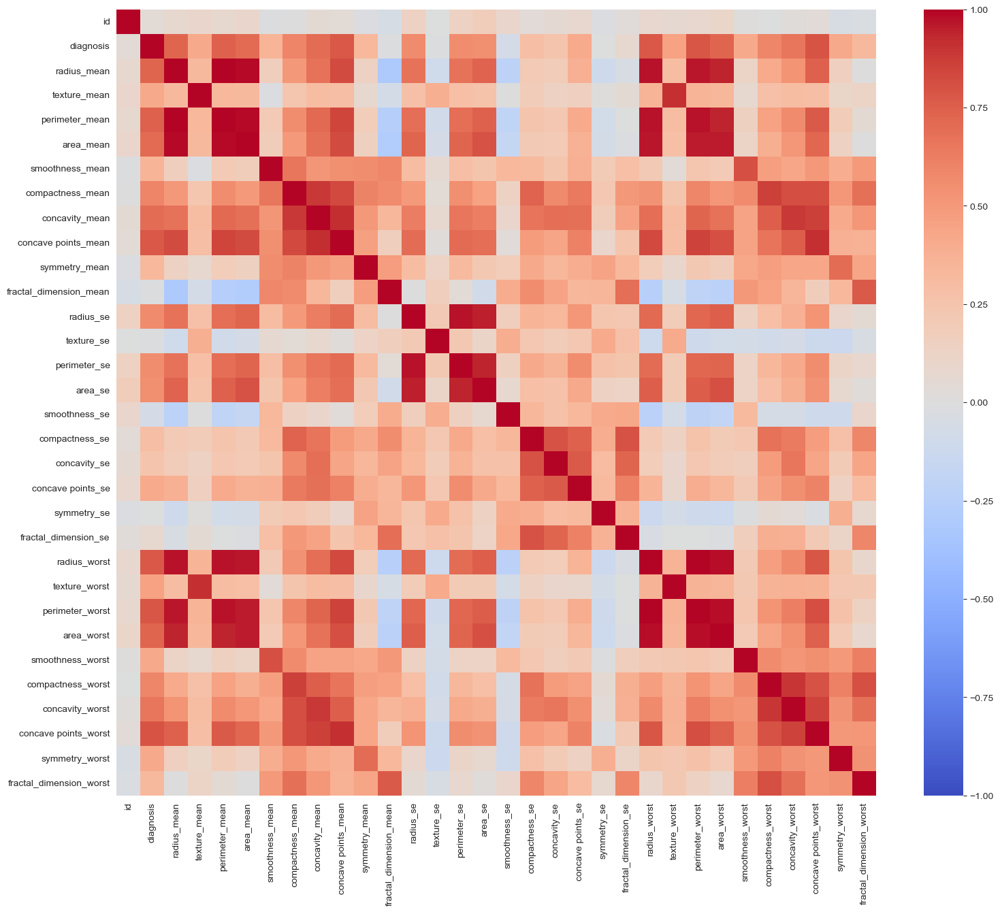

In [41]:
plt.subplots(figsize=(18,15))
sns.heatmap(data.corr(), cmap=sns.color_palette("coolwarm", 10000), vmin=-1, center=0)
plt.show()

Вывод: По матрице корреляции видим, что колонку id можно удалить, чтобы не перегружать модель. 

In [42]:
#Удалим из датасета колонку id и проверим все ли получилось
data.drop(['id'], axis=1, inplace=True)
data.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


Отдельно построим признаки, которые сильно скоррелированы.

In [43]:
k = 10 
corrmat = data.corr()
cols = corrmat.nlargest(k, 'diagnosis')['diagnosis'].index.tolist()
cols

['diagnosis',
 'concave points_worst',
 'perimeter_worst',
 'concave points_mean',
 'radius_worst',
 'perimeter_mean',
 'area_worst',
 'radius_mean',
 'area_mean',
 'concavity_mean']

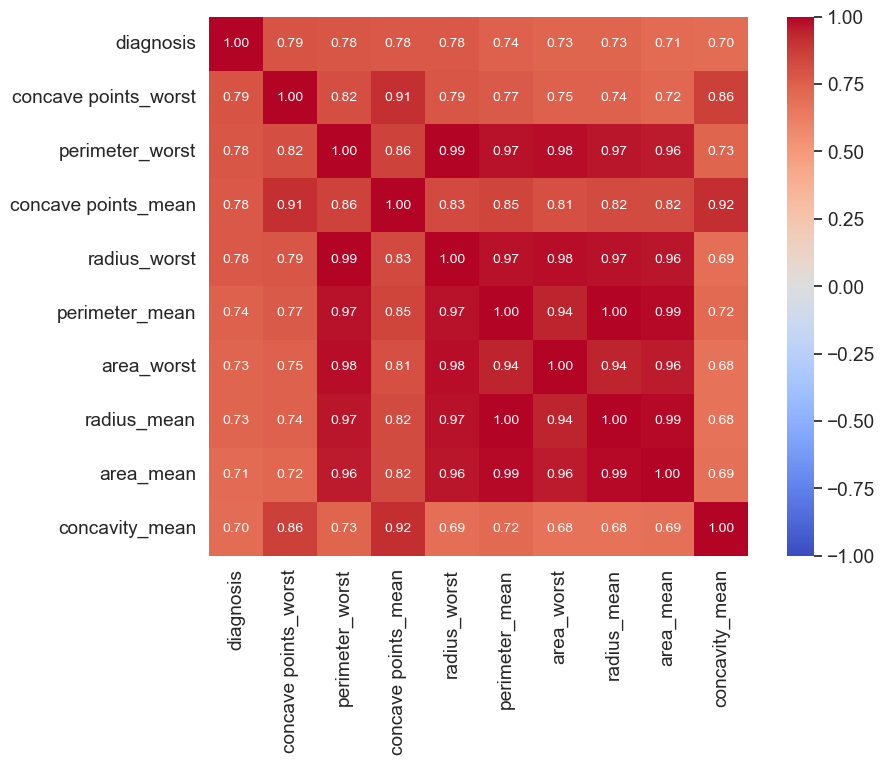

In [44]:
cm = np.corrcoef(data[cols].values.T)
plt.figure(figsize=(10,7))
sns.set(font_scale=1.25)
sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10},\
                yticklabels=cols, xticklabels=cols, vmin=-1, center=0,\
                    cmap=sns.color_palette('coolwarm',1000))
plt.show()

5. Постройте для сильно скоррелированных признаков попарные scatterplot-ы, действительно ли наблюдается линейная зависимость?

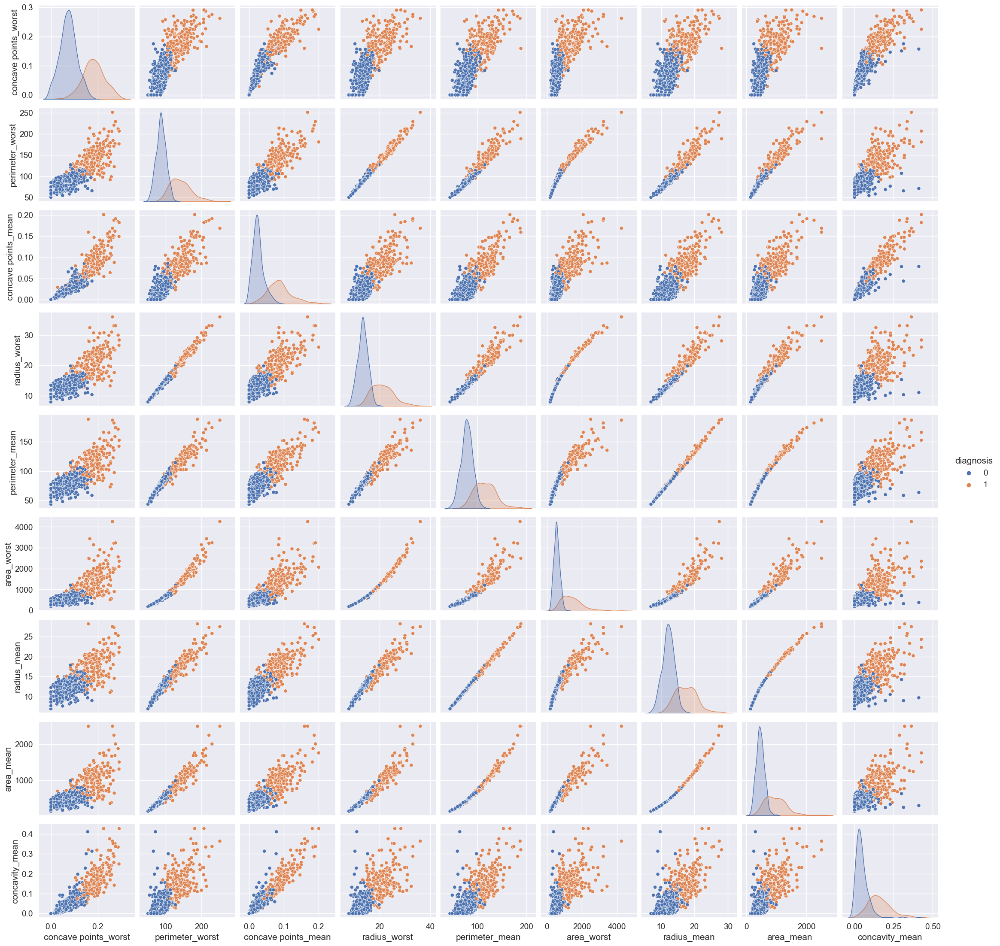

In [45]:
sns.pairplot(data=data[cols], hue='diagnosis')
plt.show()

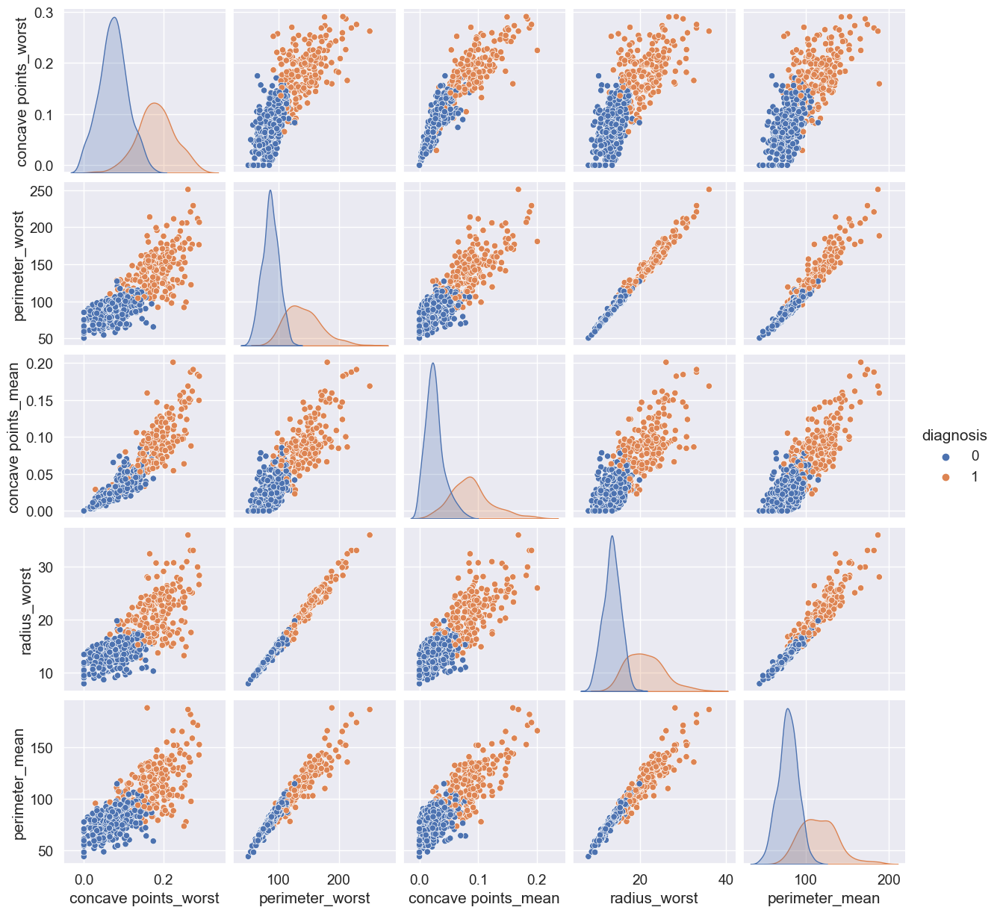

In [46]:
df = pd.DataFrame(data)
df_new = df[['diagnosis',
 'concave points_worst',
 'perimeter_worst',
 'concave points_mean',
 'radius_worst',
 'perimeter_mean']]

sns.pairplot(data=df_new, hue='diagnosis')
plt.show()

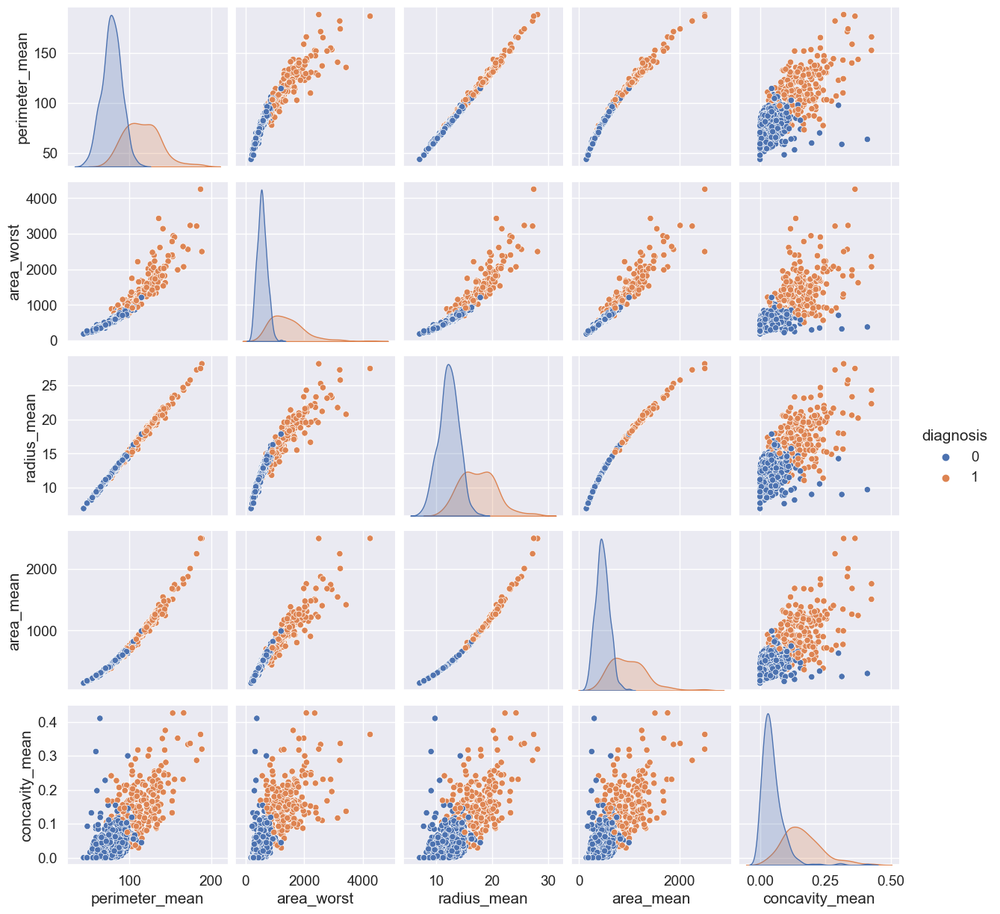

In [47]:
df = pd.DataFrame(data)
df_new = df[['diagnosis',
 'perimeter_mean',
 'area_worst',
 'radius_mean',
 'area_mean',
 'concavity_mean']]

sns.pairplot(data=df_new, hue='diagnosis')
plt.show()

Вывод: Не для всех попарных признаков наблюдается линейная зависимость, для  некоторых зависимость больше похожа на нелинейную.

6. Используя boxplots и группировку по целевой переменной, попробуйте предположить, по каким признакам наиболее удобно было бы отделить злокачественные новообразования от доброкачественных.

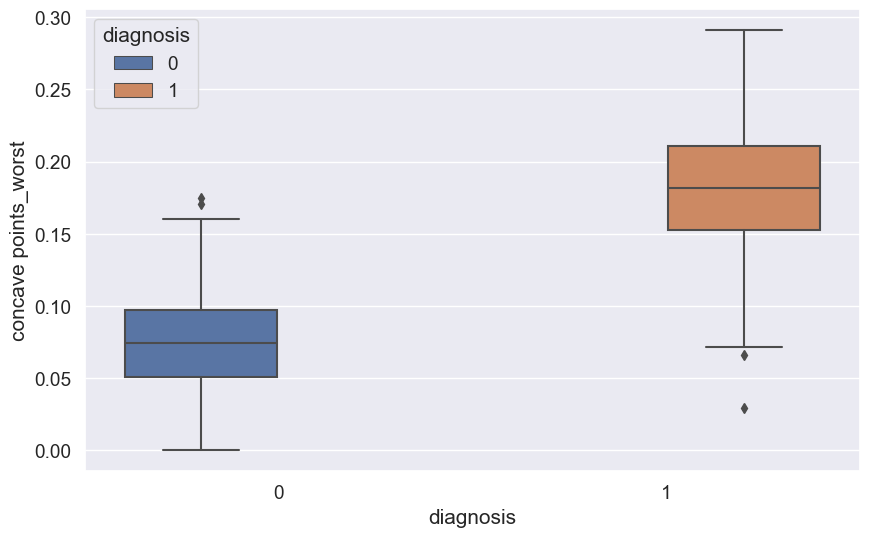

In [48]:
plt.figure(figsize=(10,6))
sns.boxplot(data=data, x='diagnosis', y='concave points_worst', hue='diagnosis')
plt.show()

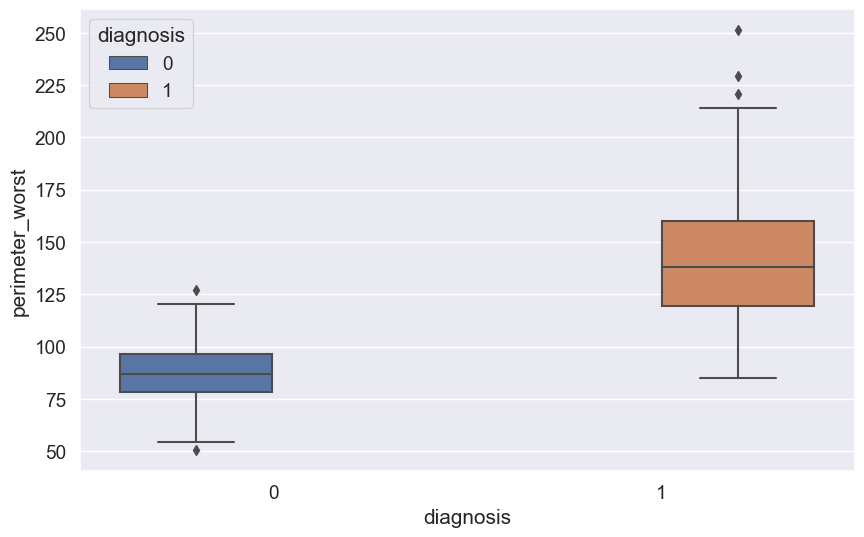

In [49]:
plt.figure(figsize=(10,6))
sns.boxplot(data=data, x='diagnosis', y='perimeter_worst', hue='diagnosis')
plt.show()

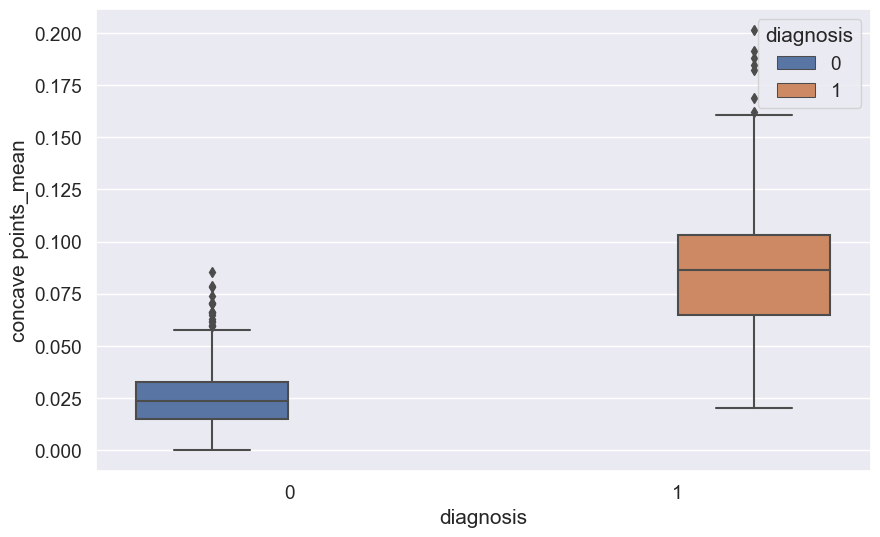

In [50]:
plt.figure(figsize=(10,6))
sns.boxplot(data=data, x='diagnosis', y='concave points_mean', hue='diagnosis')
plt.show()

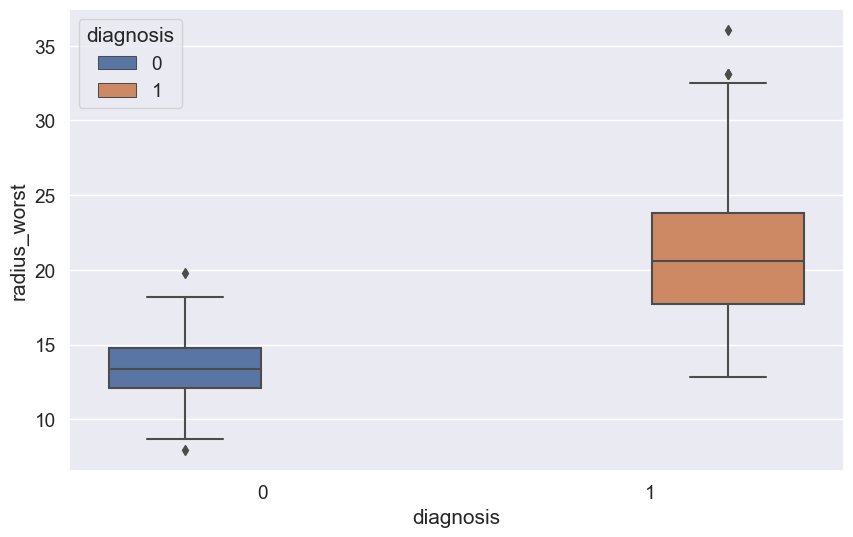

In [51]:
plt.figure(figsize=(10,6))
sns.boxplot(data=data, x='diagnosis', y='radius_worst', hue='diagnosis')
plt.show()

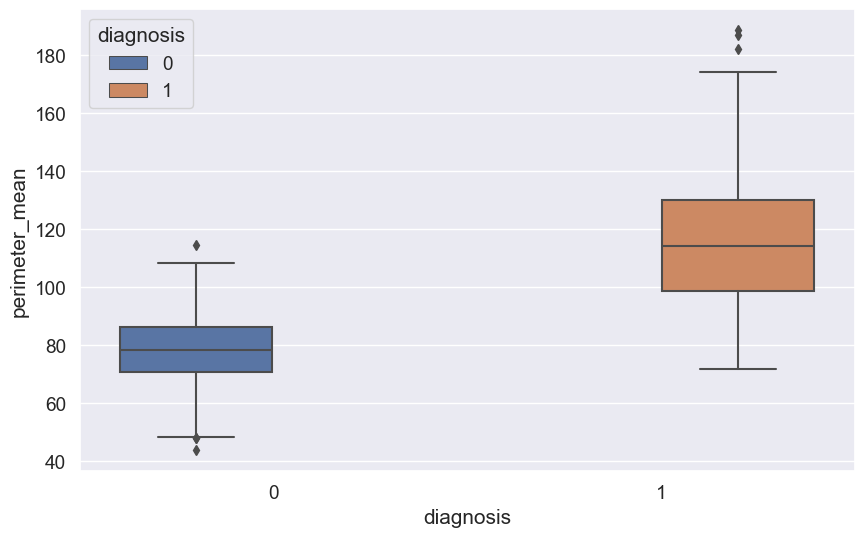

In [52]:
plt.figure(figsize=(10,6))
sns.boxplot(data=data, x='diagnosis', y='perimeter_mean', hue='diagnosis')
plt.show()

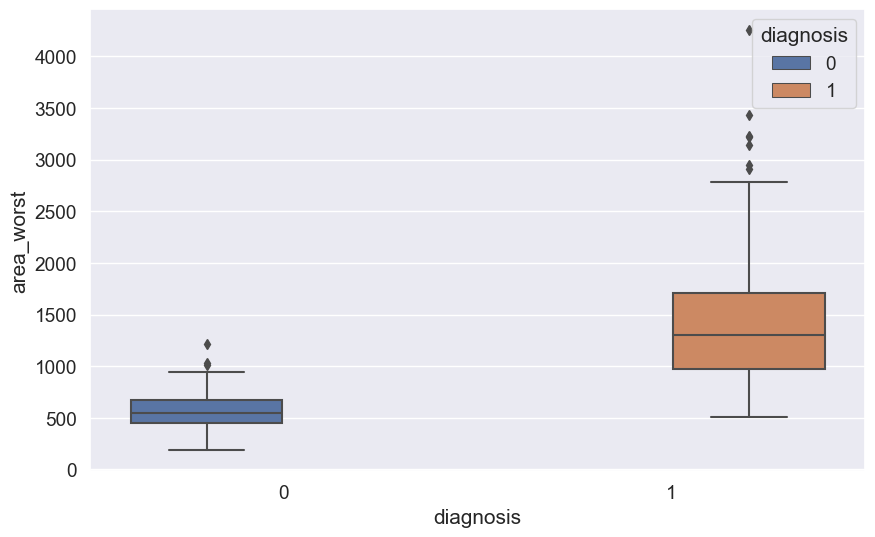

In [53]:
plt.figure(figsize=(10,6))
sns.boxplot(data=data, x='diagnosis', y='area_worst', hue='diagnosis')
plt.show()

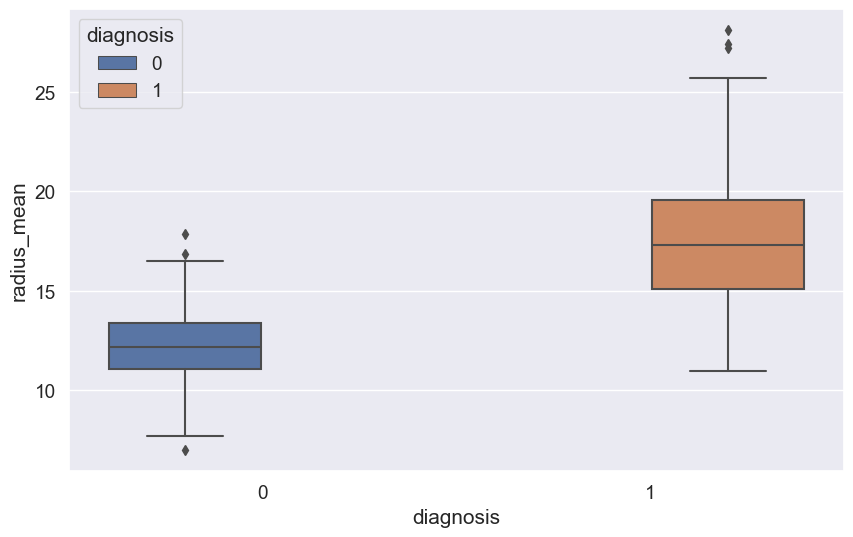

In [54]:
plt.figure(figsize=(10,6))
sns.boxplot(data=data, x='diagnosis', y='radius_mean', hue='diagnosis')
plt.show()

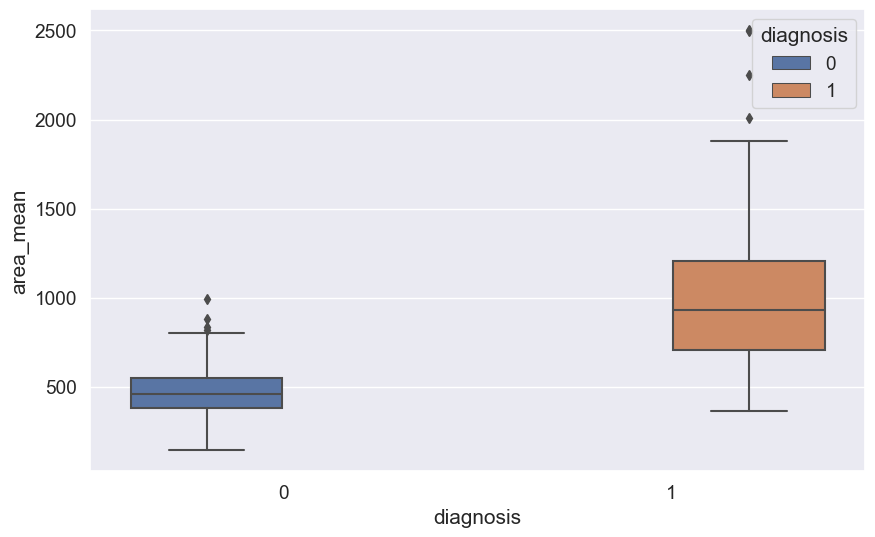

In [55]:
plt.figure(figsize=(10,6))
sns.boxplot(data=data, x='diagnosis', y='area_mean', hue='diagnosis')
plt.show()

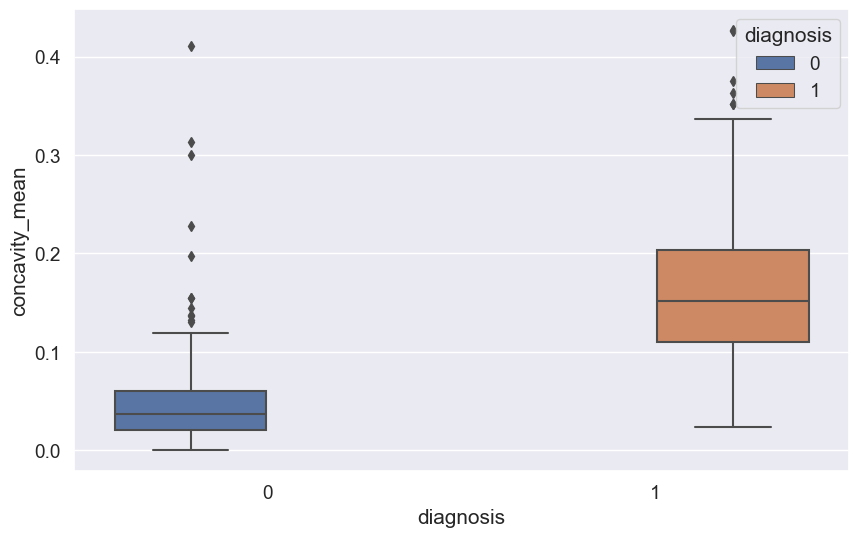

In [56]:
plt.figure(figsize=(10,6))
sns.boxplot(data=data, x='diagnosis', y='concavity_mean', hue='diagnosis')
plt.show()

Выводы: Для отделения злокачественных новообразований от доброкачественных больше подходят признаки, которые имеют высокую корреляцию с таргетом. Если выбирать из них, то проще взять те, которые имеют линейную зависимость. Если посмотреть на ТОП-10 признаков с высокой корреляцией, то многие из них имеют выбросы. Можно  попробовать построить модель, оставив эти выбросы, и если прогностическая функция модели будет слабая, тогда убрать выбросы и построить модель еще раз. И далее сравнить точность каждой модели.  

Часть 2. Моделирование при помощи kNN

1. Разбейте данные на train-test, отложив 30% выборки для тестирования.
1. Приведите все непрерывные переменные к одному масштабу при помощи стандартизации. Кратко поясните, почему стандартизация здесь нужна.
1. Постройте модель kNN "из коробки" без настройки параметров. Оцените метрики качества бинарной классификации (accuracy, precision, recall, f1_score), постройте ROC-кривую и посчитайте площадь под ней.
1. Теперь проведите настройку параметра числа соседей на кросс-валидации. Снова оцените результаты, стало ли лучше? :)

1. Разбейте данные на train-test, отложив 30% выборки для тестирования.

In [57]:
# Проверим какие данные берем в выборку: будем строить модель только на данных, обладающих высокой корреляцией с таргетом. 
features = list(data[cols])
print(features)

['diagnosis', 'concave points_worst', 'perimeter_worst', 'concave points_mean', 'radius_worst', 'perimeter_mean', 'area_worst', 'radius_mean', 'area_mean', 'concavity_mean']


In [58]:
# Отфильтруем исходный дата сет по выбранным признакам
X = data[features]
X.drop(['diagnosis'], axis=1, inplace=True)
X.head()

,concave points_worst,perimeter_worst,concave points_mean,radius_worst,perimeter_mean,area_worst,radius_mean,area_mean,concavity_mean
0,0.2654,184.60,0.14710,25.38,122.80,2019.0,17.99,1001.0,0.3001
1,0.1860,158.80,0.07017,24.99,132.90,1956.0,20.57,1326.0,0.0869
2,0.2430,152.50,0.12790,23.57,130.00,1709.0,19.69,1203.0,0.1974
3,0.2575,98.87,0.10520,14.91,77.58,567.7,11.42,386.1,0.2414
4,0.1625,152.20,0.10430,22.54,135.10,1575.0,20.29,1297.0,0.1980


In [59]:
y = data['diagnosis']
print(y)

0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    0
Name: diagnosis, Length: 569, dtype: int64


In [60]:
# Разобьем данные на train-test
from sklearn.model_selection import train_test_split

X1_train, X1_test, y1_train, y1_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

In [61]:
X1_train.describe()

,concave points_worst,perimeter_worst,concave points_mean,radius_worst,perimeter_mean,area_worst,radius_mean,area_mean,concavity_mean
count,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000
mean,0.113839,107.363844,0.048440,16.287322,92.256332,881.848241,14.176078,659.770854,0.088071
std,0.063886,33.083204,0.037712,4.799691,24.289529,570.753903,3.535730,358.865452,0.077836
min,0.000000,54.490000,0.000000,8.678000,48.340000,223.600000,7.691000,170.400000,0.000000
25%,0.063885,84.542500,0.020692,13.075000,75.805000,521.550000,11.752500,426.175000,0.029585
50%,0.099270,97.745000,0.034110,14.975000,85.980000,687.600000,13.275000,546.250000,0.061880
75%,0.160400,125.300000,0.073963,18.707500,105.625000,1061.250000,16.090000,797.400000,0.127075
max,0.275600,251.200000,0.201200,36.040000,188.500000,4254.000000,28.110000,2501.000000,0.426800


In [62]:
X1_train.shape, X1_test.shape, y1_train.shape, y1_test.shape 

((398, 9), (171, 9), (398,), (171,))

2. Приведите все непрерывные переменные к одному масштабу при помощи стандартизации. Кратко поясните, почему стандартизация здесь нужна.

В обучающем датасете переменные с разной размерностью: есть переменные, значения которых до 1, есть переменные со значениями в пределах 100, а есть значения в пределах и даже выше 1000. Если не стандартизировать переменные, тогда модель может принять переменные с высокими значениями как более значимые. Это может быть ошибочным. Поэтому все переменные нужно привести к одинаковой размерности. 

In [63]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X1_train = scaler.fit_transform(X1_train)
X1_test = scaler.transform(X1_test)

In [64]:
# Проверим, что теперь данные имеют одинаковый масштаб, проверим по среднему
X1_train.mean(axis = 0)

array([ 8.70325587e-17, -3.01266549e-16, -1.35012046e-16,  5.95838287e-16,
       -6.18154327e-16, -1.65138701e-16,  2.67792488e-16,  2.07539178e-16,
       -2.09770783e-16])

3. Постройте модель kNN "из коробки" без настройки параметров. Оцените метрики качества бинарной классификации (accuracy, precision, recall, f1_score), постройте ROC-кривую и посчитайте площадь под ней.

In [65]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=20)

In [66]:
knn_model = knn.fit(X1_train, y1_train)

In [67]:
knn_predictions_y = knn.predict(X1_test)
knn_predictions_y

array([0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0,
       1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], dtype=int64)

In [68]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [69]:
def quality(knn_predictions_y, y1_test):
    accuracy = accuracy_score(knn_predictions_y, y1_test)
    precision = precision_score(knn_predictions_y, y1_test)
    recall = recall_score(knn_predictions_y, y1_test)
    f1 = f1_score(knn_predictions_y, y1_test)
    print("Accuracy:  {:.3f}\nPrecision: {:.3f}\nRecall:    {:.3f}\nF1-score:  {:.3f}".format(accuracy, precision, recall, f1))

In [70]:
from sklearn.metrics import accuracy_score
knn = KNeighborsClassifier(n_neighbors=30)
knn.fit(X1_train, y1_train)
knn_predictions_y = knn.predict(X1_test)
quality(knn_predictions_y, y1_test)

Accuracy:  0.947
Precision: 0.889
Recall:    0.966
F1-score:  0.926


In [71]:
import sklearn.metrics as metrics
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

In [72]:
y_scores = knn.predict_proba(X1_test)

In [73]:
fpr, tpr, thresh = roc_curve(y1_test, y_scores[:,1], pos_label = 1)

In [74]:
roc_auc = metrics.auc(fpr, tpr)

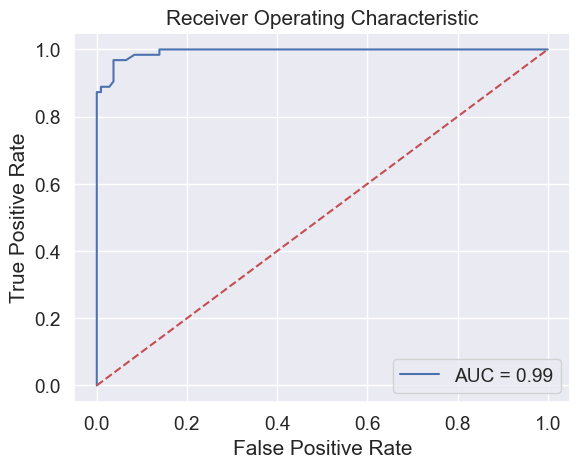

In [75]:
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show() 

In [76]:
auc_score = roc_auc_score(y1_test, y_scores[:,1])
print(auc_score)

0.9936067019400353


In [77]:
knn = KNeighborsClassifier(n_neighbors=20)
knn.fit(X1_train, y1_train)
knn_predictions_y = knn.predict(X1_test)
quality(knn_predictions_y, y1_test)

Accuracy:  0.947
Precision: 0.889
Recall:    0.966
F1-score:  0.926


In [78]:
y_scores = knn.predict_proba(X1_test)

In [79]:
fpr, tpr, thresh = roc_curve(y1_test, y_scores[:,1], pos_label = 1)

In [80]:
roc_auc = metrics.auc(fpr, tpr)

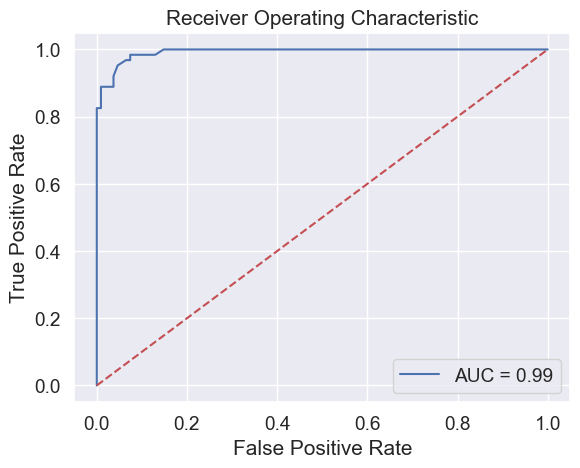

In [81]:
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show() 

In [82]:
auc_score = roc_auc_score(y1_test, y_scores[:,1])
print(auc_score)

0.9926513815402704


In [83]:
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X1_train, y1_train)
knn_predictions_y = knn.predict(X1_test)
quality(knn_predictions_y, y1_test)

Accuracy:  0.959
Precision: 0.937
Recall:    0.952
F1-score:  0.944


In [84]:
y_scores = knn.predict_proba(X1_test)

In [85]:
fpr, tpr, thresh = roc_curve(y1_test, y_scores[:,1], pos_label = 1)

In [86]:
roc_auc = metrics.auc(fpr, tpr)

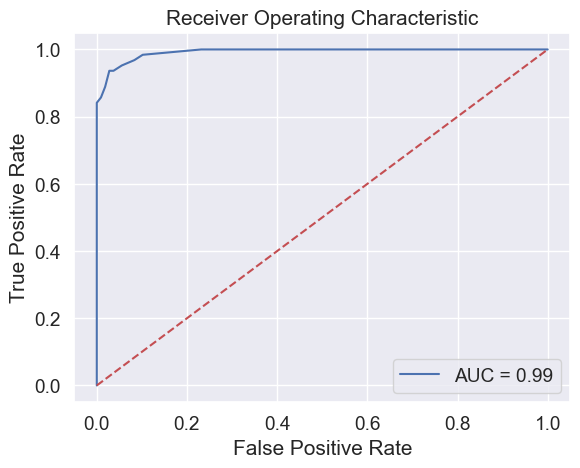

In [87]:
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show() 

In [88]:
auc_score = roc_auc_score(y1_test, y_scores[:,1])
print(auc_score)

0.9924309229864785


In [89]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X1_train, y1_train)
knn_predictions_y = knn.predict(X1_test)
quality(knn_predictions_y, y1_test)

Accuracy:  0.947
Precision: 0.921
Recall:    0.935
F1-score:  0.928


In [90]:
y_scores = knn.predict_proba(X1_test)

In [91]:
fpr, tpr, thresh = roc_curve(y1_test, y_scores[:,1], pos_label = 1)

In [92]:
roc_auc = metrics.auc(fpr, tpr)

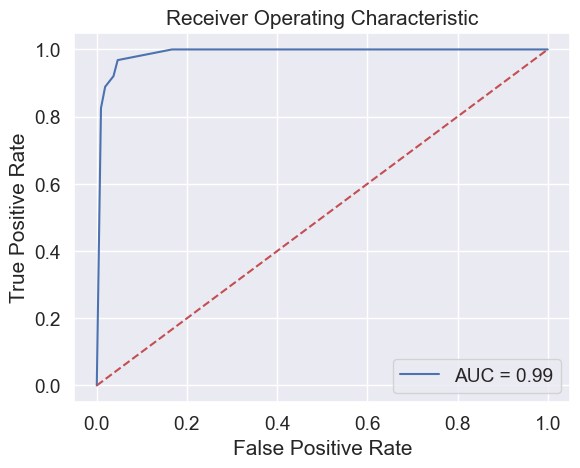

In [93]:
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show() 

In [94]:
auc_score = roc_auc_score(y1_test, y_scores[:,1])

print(auc_score)

0.989050558495003


Выводы: Попробовали подобрать разное k, видим, что при k = 30 и k = 20 критерий качества Precision ниже, чем при остальных значениях k. При k = 5 критерии качества начинают снижаться. Поэтому наиболее оптимальным вариантом выглядит k = 10. ROC-AUC при всех трех k дает 0,99, за исключением k=5, при котором ROC-AUC начинает снижаться. 

4. Теперь проведите настройку параметра числа соседей на кросс-валидации. Снова оцените результаты, стало ли лучше? :)

In [95]:
from sklearn.model_selection import cross_val_score

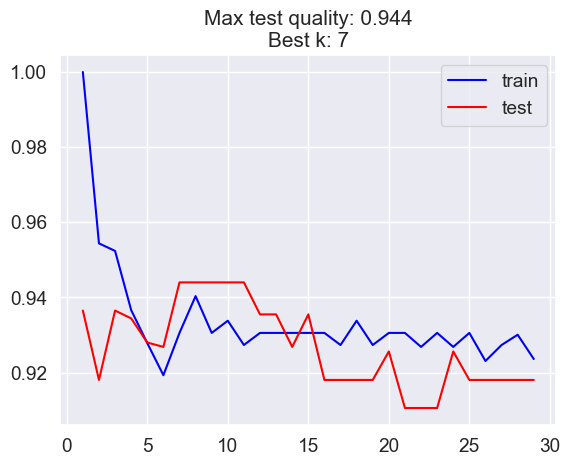

In [96]:
neighbors = range(1, 30)
f1_score_train = []
f1_score_test = []
for k in neighbors:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X1_train, y1_train)
    f1_score_train.append(f1_score(knn.predict(X1_train), y1_train))
    f1_score_test.append(f1_score(knn.predict(X1_test), y1_test))
    
plt.plot(neighbors, f1_score_train, color='blue', label='train')
plt.plot(neighbors, f1_score_test, color='red', label='test')
plt.title("Max test quality: {:.3f}\nBest k: {}".format(max(f1_score_test), np.argmax(f1_score_test)+1))
plt.legend();

Самый лучший результат k = 7

Попробуем проверить еще другим способом оптимальное количество k

In [97]:
# creating list of K for KNN
k_list = list(range(1,50,2))
# creating list of cv scores
cv_scores = []

# perform 10-fold cross validation
for k in k_list:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, X1_train, y1_train, cv=10, scoring='accuracy')
    cv_scores.append(scores.mean())

<Figure size 640x480 with 0 Axes>

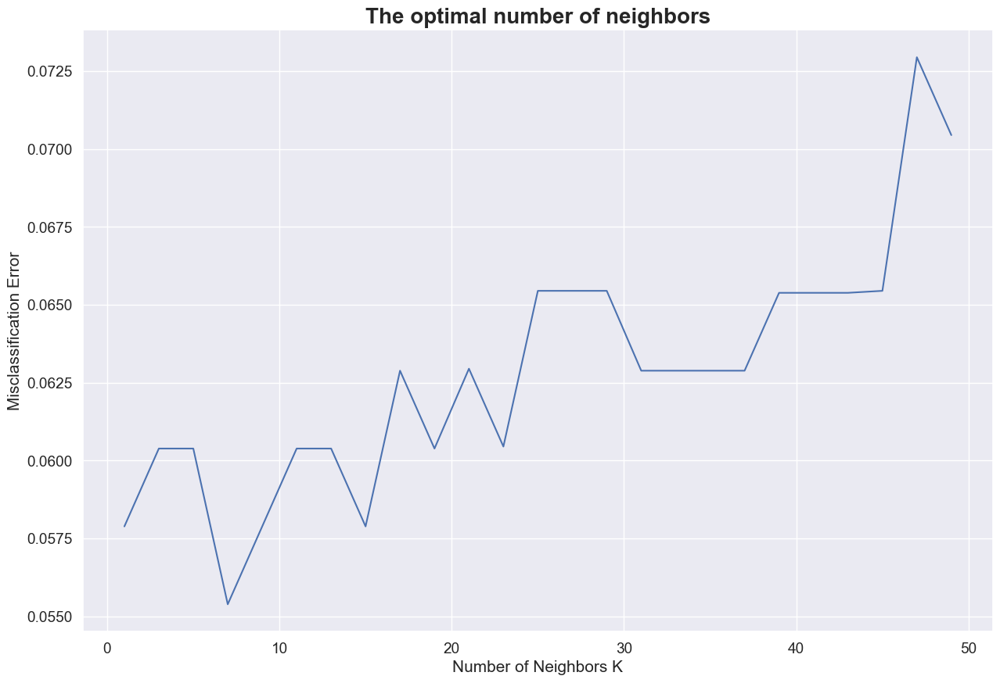

In [98]:
# changing to misclassification error
MSE = [1 - x for x in cv_scores]

plt.figure()
plt.figure(figsize=(15,10))
plt.title('The optimal number of neighbors', fontsize=20, fontweight='bold')
plt.xlabel('Number of Neighbors K', fontsize=15)
plt.ylabel('Misclassification Error', fontsize=15)
sns.set_style("whitegrid")
plt.plot(k_list, MSE)

plt.show()

In [99]:
# finding best k
best_k = k_list[MSE.index(min(MSE))]
print("The optimal number of neighbors is %d." % best_k)

The optimal number of neighbors is 7.


Оптимальное значение k = 7.

Также построим матрицу ошибок

In [100]:
from sklearn.metrics import confusion_matrix, accuracy_score

cm = confusion_matrix(y1_test, knn_predictions_y)
cm

array([[104,   4],
       [  5,  58]], dtype=int64)

In [101]:
accuracy = accuracy_score(y1_test, knn_predictions_y)*100
print('Accuracy of our model is equal ' + str(round(accuracy, 2)) + ' %.')

Accuracy of our model is equal 94.74 %.


5. Бонусное задание для любопытствующих, к которому можно вернуться после изучения логистической регрессии:
6. Как вы помните, логистическая регрессия плохо относится к линейно-зависимым признакам, уберите переменные, корреляция Пирсона между которыми превышает 0.85.
7. Постройте модель логистической регрессии "из коробки" без настройки параметров. Оцените метрики качества бинарной классификации (accuracy, precision, recall, f1_score), постройте ROC-кривую и посчитайте площадь под ней. Визуализируйте влияние коэффициентов на целевую переменную.
8. Теперь проведите настройку параметра регуляризации C на кросс-валидации (LogisticRegressionCV). Снова оцените результаты и постройте визуализацию влияния коэффициентов на целевую переменную. Сделайте интересные выводы :)
9. Какая из двух настроенных моделей, kNN или логистическая регрессия оказалась, в итоге, лучше?

In [102]:
data.corr()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
diagnosis,1.000000,0.730029,0.415185,0.742636,0.708984,0.358560,0.596534,0.696360,0.776614,0.330499,...,0.776454,0.456903,0.782914,0.733825,0.421465,0.590998,0.659610,0.793566,0.416294,0.323872
radius_mean,0.730029,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,...,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066
texture_mean,0.415185,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,...,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205
perimeter_mean,0.742636,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,...,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019
area_mean,0.708984,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,...,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738
smoothness_mean,0.358560,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,...,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316
compactness_mean,0.596534,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,...,0.535315,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382
concavity_mean,0.696360,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,...,0.688236,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930
concave points_mean,0.776614,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,...,0.830318,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661
symmetry_mean,0.330499,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,...,0.185728,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413


In [103]:
to_drop = [column for column in data.columns if any(data[column] < 0.85)]

In [104]:
print(to_drop)

['diagnosis', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']


In [105]:
X_low_corr = data[to_drop]
X_low_corr.head()

,diagnosis,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,...,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,...,0.05373,0.01587,0.03003,0.006193,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,...,0.01860,0.01340,0.01389,0.003532,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,...,0.03832,0.02058,0.02250,0.004571,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,...,0.05661,0.01867,0.05963,0.009208,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,...,0.05688,0.01885,0.01756,0.005115,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [106]:
X_low_corr.drop(['diagnosis'], axis=1, inplace=True)
X_low_corr.head()

,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,smoothness_se,...,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,0.006399,...,0.05373,0.01587,0.03003,0.006193,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,0.005225,...,0.01860,0.01340,0.01389,0.003532,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,0.006150,...,0.03832,0.02058,0.02250,0.004571,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,0.009110,...,0.05661,0.01867,0.05963,0.009208,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,0.011490,...,0.05688,0.01885,0.01756,0.005115,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [107]:
y = data['diagnosis']
print(y)

0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    0
Name: diagnosis, Length: 569, dtype: int64


In [108]:
# Разобьем данные на train-test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_low_corr, y, test_size = 0.3, random_state = 42)

In [109]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape 

((398, 21), (171, 21), (398,), (171,))

In [110]:
# Стандартизируем
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [111]:
# Проверим, что теперь данные имеют одинаковый масштаб, проверим по среднему
X_train_scaled.mean(axis = 0)

array([ 8.92641628e-18, -9.59589750e-17, -2.09770783e-16, -1.35012046e-16,
        7.25271323e-16,  2.80066311e-16,  1.22738224e-16,  6.24849139e-17,
        3.25814194e-16,  2.36550031e-16,  3.12424570e-17, -5.57901017e-17,
       -2.58866072e-16,  9.14957669e-17,  3.79372692e-17,  9.10494460e-16,
       -1.74065117e-16,  1.29433036e-16,  8.70325587e-17, -2.73371499e-16,
        1.42822660e-16])

In [112]:
def quality_report(prediction, actual):
    print("Accuracy: {:.3f}\nPrecision: {:.3f}\nRecall: {:.3f}\nf1_score: {:.3f}".format(
        accuracy_score(prediction, actual),
        precision_score(prediction, actual),
        recall_score(prediction, actual),
        f1_score(prediction, actual)
    ))

In [113]:
# Импортируем логистическую регрессию
from sklearn.linear_model import LogisticRegression
 
# создадим объект этого класса и запишем его в переменную model
model = LogisticRegression(penalty = 'none')
 
# обучим модель
lr_model = model.fit(X_train_scaled, y_train)
 
# выполним предсказание на тестовой выборке
lr_y_pred = model.predict(X_test_scaled)
lr_y_pred

array([0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1,
       1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1,
       0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], dtype=int64)

In [114]:
lr_y_pred_proba = lr_model.predict_proba(X_test_scaled)
lr_y_pred_proba

array([[9.50250842e-01, 4.97491576e-02],
       [1.11003923e-08, 9.99999989e-01],
       [2.55320209e-05, 9.99974468e-01],
       [1.00000000e+00, 4.62036648e-10],
       [9.99999652e-01, 3.47725308e-07],
       [0.00000000e+00, 1.00000000e+00],
       [4.21884749e-15, 1.00000000e+00],
       [2.19749342e-04, 9.99780251e-01],
       [3.24830304e-04, 9.99675170e-01],
       [9.99997925e-01, 2.07541201e-06],
       [9.99651033e-01, 3.48966608e-04],
       [4.86901391e-05, 9.99951310e-01],
       [9.99987157e-01, 1.28431389e-05],
       [9.53098738e-01, 4.69012619e-02],
       [9.94694505e-01, 5.30549459e-03],
       [3.80840593e-05, 9.99961916e-01],
       [9.99984618e-01, 1.53822599e-05],
       [9.99999999e-01, 8.25767033e-10],
       [1.00000000e+00, 3.31776606e-13],
       [1.77975412e-11, 1.00000000e+00],
       [9.92207395e-01, 7.79260515e-03],
       [9.97578662e-01, 2.42133792e-03],
       [0.00000000e+00, 1.00000000e+00],
       [9.99999965e-01, 3.46608699e-08],
       [9.999985

In [115]:
print("Train quality:")
quality_report(lr_model.predict(X_train_scaled), y_train)
print("\nTest quality:")
quality_report(lr_model.predict(X_test_scaled), y_test)

Train quality:
Accuracy: 0.982
Precision: 0.960
Recall: 0.993
f1_score: 0.976

Test quality:
Accuracy: 0.930
Precision: 0.921
Recall: 0.892
f1_score: 0.906


In [116]:
# рассчитываем roc-кривую
lr_y_pred_proba = lr_model.predict_proba(X_test_scaled)

fpr, tpr, thresh = roc_curve(y_test, lr_y_pred_proba[:,1], pos_label = 1)
roc_auc = metrics.auc(fpr, tpr)
print(roc_auc)

0.9860376249265138


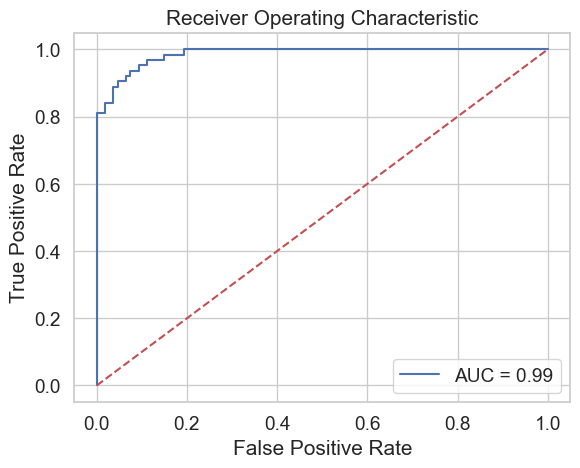

In [117]:
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show() 

In [118]:
cm = confusion_matrix(y_test, lr_y_pred)
cm

array([[101,   7],
       [  5,  58]], dtype=int64)

In [119]:
# Определим влияние коэффициентов на целевую переменную

featureImportance = pd.DataFrame({'feature': X_low_corr.columns, 
                                  'importance': lr_model.coef_[0]})
featureImportance

,feature,importance
0,smoothness_mean,-1.455765
1,compactness_mean,-4.219567
2,concavity_mean,-2.209725
3,concave points_mean,12.387826
4,symmetry_mean,-2.413494
5,fractal_dimension_mean,-0.636071
6,radius_se,9.371457
7,texture_se,1.843581
8,perimeter_se,-3.824965
9,smoothness_se,0.934699


<AxesSubplot:xlabel='feature'>

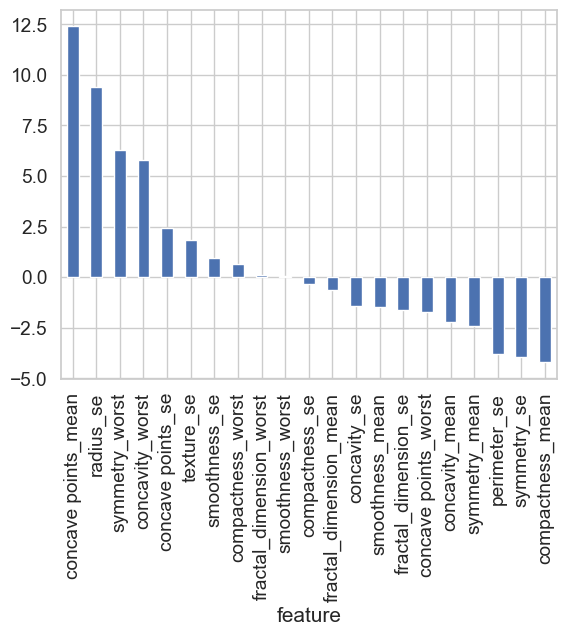

In [120]:
# Визуализируем влияние коэффициентов на целевую переменную

featureImportance.set_index('feature', inplace=True)
featureImportance.sort_values(['importance'], ascending=False, inplace=True)
featureImportance['importance'].plot.bar()

Видим, что такие параметры, как smoothness_se, compactness_worst, fractal_dimension_worst, smoothness_worst, compactness_se,  fractal_dimension_mean имеют очень маленький вес на предсказание модели, поэтому их можно убрать из модели. 

In [121]:
# Регуляризация с L2
from sklearn.model_selection import GridSearchCV
parameters = {'C': [0.001, 0.01, 0.1, 1]}

model = LogisticRegression(penalty = 'l2')
clf = GridSearchCV(model, parameters, scoring = 'roc_auc', cv = 23)
clf.fit(X_low_corr, data['diagnosis'])

GridSearchCV(cv=23, estimator=LogisticRegression(),
             param_grid={'C': [0.001, 0.01, 0.1, 1]}, scoring='roc_auc')

In [122]:
pd.DataFrame(clf.cv_results_)[['param_C','mean_test_score']]

,param_C,mean_test_score
0,0.001,0.888857
1,0.01,0.905837
2,0.1,0.935314
3,1,0.956804


In [123]:
print('Best C:', clf.best_params_, '\t Best score: ',clf.best_score_)

Best C: {'C': 1} 	 Best score:  0.956803542673108


In [124]:
# Регуляризация с L1
from sklearn.model_selection import GridSearchCV
parameters = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}

model = LogisticRegression(solver = 'liblinear', penalty = 'l1')
clf = GridSearchCV(model, parameters, scoring = 'roc_auc', cv = 23)
clf.fit(X_low_corr, data['diagnosis'])

GridSearchCV(cv=23,
             estimator=LogisticRegression(penalty='l1', solver='liblinear'),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100]},
             scoring='roc_auc')

In [125]:
pd.DataFrame(clf.cv_results_)[['param_C','mean_test_score']]

,param_C,mean_test_score
0,0.001,0.500000
1,0.01,0.578341
2,0.1,0.937110
3,1,0.974634
4,10,0.989440
5,100,0.990133


In [126]:
print('Best C:', clf.best_params_, '\t Best score: ',clf.best_score_)

Best C: {'C': 100} 	 Best score:  0.9901328502415458


Для данной регуляризации L1 дает более высокий показатель, чем L2. Поэтому в данном случае лучше использовать L1. 

In [127]:
# Сравним две модели: log Regression и kNN (будем брать knn с k=7, т.к. выяснили, что это самый оптимальный показатель)

In [128]:
from sklearn.metrics import accuracy_score
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(X1_train, y1_train)
knn_predictions_y = knn.predict(X1_test)
quality(knn_predictions_y, y1_test)

Accuracy:  0.959
Precision: 0.937
Recall:    0.952
F1-score:  0.944


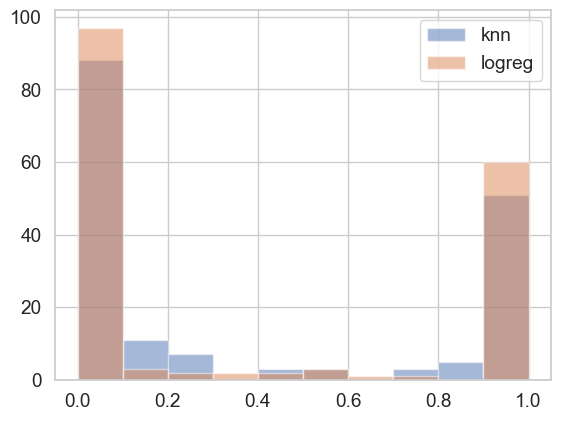

In [129]:
plt.hist(knn.predict_proba(X1_test)[:, 1], alpha=0.5, label = 'knn');
plt.hist(lr_model.predict_proba(X_test_scaled)[:, 1], alpha=0.5, label = 'logreg');
plt.legend();

Модель логистической регрессии является более уверенной в своей предсказательной функции, чем модель kNN.